In [1]:
import pandas_profiling
import nltk
import numpy as np
import pandas as pd
import os
import wordcloud
import re
import sys
import matplotlib.pyplot as plt 
import seaborn as sb
from nltk.corpus import stopwords
import warnings 
warnings.filterwarnings("ignore")
import unidecode
from wordcloud import WordCloud
from nltk.stem import WordNetLemmatizer 
nltk.download('wordnet')
from nltk.stem import PorterStemmer
nltk.download('punkt')
from nltk.tokenize import word_tokenize 
import matplotlib.animation as animation
import operator
import plotly.express as px
from collections import Counter
%matplotlib inline

C:\Users\HP\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\HP\anaconda3\lib\site-packages\numpy\.libs\libopenblas.pyqhxlvvq7vesdpuvuadxevjobghjpay.gfortran-win_amd64.dll
C:\Users\HP\anaconda3\lib\site-packages\numpy\.libs\libopenblas.XWYDX2IKJW2NMTWSFYNGFUWKQU3LYTCZ.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:\n%s" %
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
import keras

In [3]:
import tensorflow

AttributeError: module 'tensorflow.python.keras.layers' has no attribute 'Dense'

In [4]:
from keras.layers.normalization import layer_normalization

AttributeError: module 'tensorflow.python.keras.layers' has no attribute 'Dense'

In [4]:
from sklearn.feature_extraction.text import CountVectorizer
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical
import re

ModuleNotFoundError: No module named 'keras.preprocessing.text'

In [3]:
import gensim

In [4]:
from gensim import corpora

In [6]:
from pandas import DataFrame

In [7]:
print (os.listdir(os.getcwd()))

['.git', '.gitattributes', '.ipynb_checkpoints', 'Data preparation.ipynb', 'Extracting tweets.ipynb', 'file-name', 'github', 'hate', 'hate.csv', 'hate1.csv', 'IMP -Copy1.ipynb', 'IMP .ipynb', 'test.csv', 'testmodel', 'test_model', 'twitterlogo.png', 'Untitled.ipynb', 'Untitled1.ipynb', 'Untitled2.ipynb', 'use.csv', 'word', 'w_model']


In [8]:
df = pd.read_csv("use.csv")
print("Training Set:"% df.columns,df.shape, len(df))

Training Set: (31962, 3) 31962


In [9]:
df.columns.values.tolist()  

['id', 'label', 'tweet']

In [10]:
df.head()

,id,label,tweet
0,1,0,@user when a father is dysfunctional and is s...
1,2,0,@user @user thanks for #lyft credit i can't us...
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation


In [11]:
df.columns.values.tolist()  # return a list of column names

['id', 'label', 'tweet']

In [12]:

from pandas_profiling import ProfileReport

In [13]:

pip install -U pandas-profiling

  Using cached htmlmin-0.1.12-py3-none-any.whlNote: you may need to restart the kernel to use updated packages.


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'C:\\Users\\HP\\anaconda3\\Lib\\site-packages\\numpy\\.libs\\libopenblas.XWYDX2IKJW2NMTWSFYNGFUWKQU3LYTCZ.gfortran-win_amd64.dll'
Consider using the `--user` option or check the permissions.




  Using cached joblib-1.0.1-py3-none-any.whl (303 kB)
  Using cached tangled_up_in_unicode-0.1.0-py3-none-any.whl (3.1 MB)
  Using cached networkx-2.6.3-py3-none-any.whl (1.9 MB)
  Using cached ImageHash-4.2.1-py2.py3-none-any.whl
  Using cached numpy-1.21.5-cp38-cp38-win_amd64.whl (14.0 MB)
  Using cached typing_extensions-4.0.1-py3-none-any.whl (22 kB)
  Using cached PyWavelets-1.2.0-cp38-cp38-win_amd64.whl (4.2 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.17.5
    Uninstalling numpy-1.17.5:
      Successfully uninstalled numpy-1.17.5
  Rolling back uninstall of numpy
  Moving to c:\users\hp\anaconda3\lib\site-packages\numpy-1.17.5.dist-info\
   from C:\Users\HP\anaconda3\Lib\site-packages\~umpy-1.17.5.dist-info
  Moving to c:\users\hp\anaconda3\lib\site-packages\numpy\.libs\libopenblas.pyqhxlvvq7vesdpuvuadxevjobghjpay.gfortran-win_amd64.dll
   from C:\Users\HP\AppData\Local\Temp\pip-uninstall-gsmjecni\libopenblas.pyqhxlvvq7vesdpuvuadxevjobghjpay.gfortr

In [14]:
 ProfileReport(df)

TypeError: concat() got an unexpected keyword argument 'join_axes'

In [15]:
df.tail()

,id,label,tweet
31957,31958,0,ate @user isz that youuu?ðððððð...
31958,31959,0,to see nina turner on the airwaves trying to...
31959,31960,0,listening to sad songs on a monday morning otw...
31960,31961,1,"@user #sikh #temple vandalised in in #calgary,..."
31961,31962,0,thank you @user for you follow


In [16]:
df.drop_duplicates(subset = ['tweet'], inplace = True, keep= 'first')

In [17]:
duplicate_text = df[df.duplicated(subset = ['tweet','label'])]

duplicate_text

,id,label,tweet


In [18]:
df['tweet'].isnull().sum() # return the number of missing values in tweet

0

In [19]:
#knowing how many missing values in the data
count_nan=df.isnull().sum().sum()
print ('Count of NaN: ' + str(count_nan))

Count of NaN: 0


In [20]:
#Data doesn't contain duplicate values neither does it contain missing values

In [21]:
#Code to remove @
df['clean_tweet'] = df['tweet'].apply(lambda x : ' '.join([tweet for tweet in x.split()if not tweet.startswith("@")]))

In [22]:
#Removing numbers
df['clean_tweet'] = df['clean_tweet'].str.replace('\d+', '')


In [23]:
df['clean_tweet'] [7]

"the next school year is the year for exams.ð\x9f\x98¯ can't think about that ð\x9f\x98\xad #school #exams #hate #imagine #actorslife #revolutionschool #girl"

In [24]:
df.head(10)

,id,label,tweet,clean_tweet
0,1,0,@user when a father is dysfunctional and is s...,when a father is dysfunctional and is so selfi...
1,2,0,@user @user thanks for #lyft credit i can't us...,thanks for #lyft credit i can't use cause they...
2,3,0,bihday your majesty,bihday your majesty
3,4,0,#model i love u take with u all the time in ...,#model i love u take with u all the time in ur...
4,5,0,factsguide: society now #motivation,factsguide: society now #motivation
5,6,0,[2/2] huge fan fare and big talking before the...,[/] huge fan fare and big talking before they ...
6,7,0,@user camping tomorrow @user @user @user @use...,camping tomorrow dannyâ¦
7,8,0,the next school year is the year for exams.ð...,the next school year is the year for exams.ð...
8,9,0,we won!!! love the land!!! #allin #cavs #champ...,we won!!! love the land!!! #allin #cavs #champ...
9,10,0,@user @user welcome here ! i'm it's so #gr...,welcome here ! i'm it's so #gr !


In [25]:
df.describe()

,id,label
count,29530.000000,29530.000000
mean,15801.067050,0.068168
std,9252.090245,0.252038
min,1.000000,0.000000
25%,7740.250000,0.000000
50%,15738.500000,0.000000
75%,23801.750000,0.000000
max,31962.000000,1.000000


In [26]:
#remove special charactes and url as well
df['clean_tweet'] = df['clean_tweet'].str.replace("([^a-zA-Z#])|(\w+:\/\/\S+)", " " )

    

In [27]:
df.head(10)

,id,label,tweet,clean_tweet
0,1,0,@user when a father is dysfunctional and is s...,when a father is dysfunctional and is so selfi...
1,2,0,@user @user thanks for #lyft credit i can't us...,thanks for #lyft credit i can t use cause they...
2,3,0,bihday your majesty,bihday your majesty
3,4,0,#model i love u take with u all the time in ...,#model i love u take with u all the time in ur...
4,5,0,factsguide: society now #motivation,factsguide society now #motivation
5,6,0,[2/2] huge fan fare and big talking before the...,huge fan fare and big talking before they ...
6,7,0,@user camping tomorrow @user @user @user @use...,camping tomorrow danny
7,8,0,the next school year is the year for exams.ð...,the next school year is the year for exams ...
8,9,0,we won!!! love the land!!! #allin #cavs #champ...,we won love the land #allin #cavs #champ...
9,10,0,@user @user welcome here ! i'm it's so #gr...,welcome here i m it s so #gr


In [28]:

pip install unidecode

In [28]:
#Removing all the greek characters using unidecode library
df['clean_tweet'] = df['clean_tweet'].apply(lambda x : ' '.join([unidecode.unidecode(word) for word in x.split()]))


In [29]:
#Finding words with # attached to it
df['#'] = df['clean_tweet'].apply(lambda x : ' '.join([word for word in x.split() if word.startswith('#')]))

In [30]:
df.head()

,id,label,tweet,clean_tweet,#
0,1,0,@user when a father is dysfunctional and is s...,when a father is dysfunctional and is so selfi...,#run
1,2,0,@user @user thanks for #lyft credit i can't us...,thanks for #lyft credit i can t use cause they...,#lyft #disapointed #getthanked
2,3,0,bihday your majesty,bihday your majesty,
3,4,0,#model i love u take with u all the time in ...,#model i love u take with u all the time in ur,#model
4,5,0,factsguide: society now #motivation,factsguide society now #motivation,#motivation


In [31]:
#Removing stopwords
import nltk
nltk.download('stopwords')
df['clean_tweet'] = df['clean_tweet'].apply(lambda x : ' '.join([word for word in x.split() if not word in set(stopwords.words('english'))]))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [32]:
#nltk tokenization
from nltk.tokenize import word_tokenize 

df['tokenize_tweet'] = df.apply(lambda row: nltk.word_tokenize(row['clean_tweet']), axis=1)

In [33]:
df['tokenize_tweet']

0        [father, dysfunctional, selfish, drags, kids, ...
1        [thanks, #, lyft, credit, use, cause, offer, w...
2                                        [bihday, majesty]
3                   [#, model, love, u, take, u, time, ur]
4                     [factsguide, society, #, motivation]
                               ...                        
31956    [fishing, tomorrow, carnt, wait, first, time, ...
31957                                    [ate, isz, youuu]
31958    [see, nina, turner, airwaves, trying, wrap, ma...
31959    [listening, sad, songs, monday, morning, otw, ...
31961                                      [thank, follow]
Name: tokenize_tweet, Length: 29530, dtype: object

In [34]:
hh = df['#']

In [35]:

hh.head()

0                              #run
1    #lyft #disapointed #getthanked
2                                  
3                            #model
4                       #motivation
Name: #, dtype: object

In [36]:
type(hh)

pandas.core.series.Series

In [37]:
hh = pd.DataFrame(hh)

In [38]:
hh = hh.rename({'#':'hash'},axis = 'columns')

In [39]:
hh.head()

,hash
0,#run
1,#lyft #disapointed #getthanked
2,
3,#model
4,#motivation


In [40]:
hh[hh['hash'] == ''] = 'No hashtags'

In [41]:
df.head()

,id,label,tweet,clean_tweet,#,tokenize_tweet
0,1,0,@user when a father is dysfunctional and is s...,father dysfunctional selfish drags kids dysfun...,#run,"[father, dysfunctional, selfish, drags, kids, ..."
1,2,0,@user @user thanks for #lyft credit i can't us...,thanks #lyft credit use cause offer wheelchair...,#lyft #disapointed #getthanked,"[thanks, #, lyft, credit, use, cause, offer, w..."
2,3,0,bihday your majesty,bihday majesty,,"[bihday, majesty]"
3,4,0,#model i love u take with u all the time in ...,#model love u take u time ur,#model,"[#, model, love, u, take, u, time, ur]"
4,5,0,factsguide: society now #motivation,factsguide society #motivation,#motivation,"[factsguide, society, #, motivation]"


In [42]:
data_frame = pd.concat([df,hh],axis = 1)

In [43]:
data_frame.head(10)

,id,label,tweet,clean_tweet,#,tokenize_tweet,hash
0,1,0,@user when a father is dysfunctional and is s...,father dysfunctional selfish drags kids dysfun...,#run,"[father, dysfunctional, selfish, drags, kids, ...",#run
1,2,0,@user @user thanks for #lyft credit i can't us...,thanks #lyft credit use cause offer wheelchair...,#lyft #disapointed #getthanked,"[thanks, #, lyft, credit, use, cause, offer, w...",#lyft #disapointed #getthanked
2,3,0,bihday your majesty,bihday majesty,,"[bihday, majesty]",No hashtags
3,4,0,#model i love u take with u all the time in ...,#model love u take u time ur,#model,"[#, model, love, u, take, u, time, ur]",#model
4,5,0,factsguide: society now #motivation,factsguide society #motivation,#motivation,"[factsguide, society, #, motivation]",#motivation
5,6,0,[2/2] huge fan fare and big talking before the...,huge fan fare big talking leave chaos pay disp...,#allshowandnogo,"[huge, fan, fare, big, talking, leave, chaos, ...",#allshowandnogo
6,7,0,@user camping tomorrow @user @user @user @use...,camping tomorrow danny,,"[camping, tomorrow, danny]",No hashtags
7,8,0,the next school year is the year for exams.ð...,next school year year exams think #school #exa...,#school #exams #hate #imagine #actorslife #rev...,"[next, school, year, year, exams, think, #, sc...",#school #exams #hate #imagine #actorslife #rev...
8,9,0,we won!!! love the land!!! #allin #cavs #champ...,love land #allin #cavs #champions #cleveland #...,#allin #cavs #champions #cleveland #clevelandc...,"[love, land, #, allin, #, cavs, #, champions, ...",#allin #cavs #champions #cleveland #clevelandc...
9,10,0,@user @user welcome here ! i'm it's so #gr...,welcome #gr,#gr,"[welcome, #, gr]",#gr


In [44]:

data_frame.drop('#', axis = 1,inplace =True)

In [45]:
#Lemmitization
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()
lemmatized_output = ' '.join([lemmatizer.lemmatize(w) for w in data_frame])
data_frame['clean_tweet'] = data_frame['clean_tweet'].apply(lambda x : ' '.join([lemmatizer.lemmatize(word) for word in x.split()]))

In [46]:
data_frame.head()

,id,label,tweet,clean_tweet,tokenize_tweet,hash
0,1,0,@user when a father is dysfunctional and is s...,father dysfunctional selfish drag kid dysfunct...,"[father, dysfunctional, selfish, drags, kids, ...",#run
1,2,0,@user @user thanks for #lyft credit i can't us...,thanks #lyft credit use cause offer wheelchair...,"[thanks, #, lyft, credit, use, cause, offer, w...",#lyft #disapointed #getthanked
2,3,0,bihday your majesty,bihday majesty,"[bihday, majesty]",No hashtags
3,4,0,#model i love u take with u all the time in ...,#model love u take u time ur,"[#, model, love, u, take, u, time, ur]",#model
4,5,0,factsguide: society now #motivation,factsguide society #motivation,"[factsguide, society, #, motivation]",#motivation


In [47]:
len(data_frame)

29530

In [48]:
#Stemming
from nltk.stem import PorterStemmer 
ps = PorterStemmer()

data_frame['clean_tweet'] = data_frame['clean_tweet'].apply(lambda x : ' '.join([ps.stem(word) for word in x.split()]))

In [49]:
data_frame.head(10)

,id,label,tweet,clean_tweet,tokenize_tweet,hash
0,1,0,@user when a father is dysfunctional and is s...,father dysfunct selfish drag kid dysfunct #run,"[father, dysfunctional, selfish, drags, kids, ...",#run
1,2,0,@user @user thanks for #lyft credit i can't us...,thank #lyft credit use caus offer wheelchair v...,"[thanks, #, lyft, credit, use, cause, offer, w...",#lyft #disapointed #getthanked
2,3,0,bihday your majesty,bihday majesti,"[bihday, majesty]",No hashtags
3,4,0,#model i love u take with u all the time in ...,#model love u take u time ur,"[#, model, love, u, take, u, time, ur]",#model
4,5,0,factsguide: society now #motivation,factsguid societi #motiv,"[factsguide, society, #, motivation]",#motivation
5,6,0,[2/2] huge fan fare and big talking before the...,huge fan fare big talk leav chao pay disput ge...,"[huge, fan, fare, big, talking, leave, chaos, ...",#allshowandnogo
6,7,0,@user camping tomorrow @user @user @user @use...,camp tomorrow danni,"[camping, tomorrow, danny]",No hashtags
7,8,0,the next school year is the year for exams.ð...,next school year year exam think #school #exam...,"[next, school, year, year, exams, think, #, sc...",#school #exams #hate #imagine #actorslife #rev...
8,9,0,we won!!! love the land!!! #allin #cavs #champ...,love land #allin #cav #champion #cleveland #cl...,"[love, land, #, allin, #, cavs, #, champions, ...",#allin #cavs #champions #cleveland #clevelandc...
9,10,0,@user @user welcome here ! i'm it's so #gr...,welcom #gr,"[welcome, #, gr]",#gr


In [50]:

import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from wordcloud import STOPWORDS
import re
import csv
import os

import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
from wordcloud import STOPWORDS
warnings.filterwarnings('ignore', category=DeprecationWarning)
%matplotlib inline

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [51]:
from PIL import Image
import numpy as np
twitter_mask= np.array(Image.open("twitterlogo.png"))
twitter_mask

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

all words


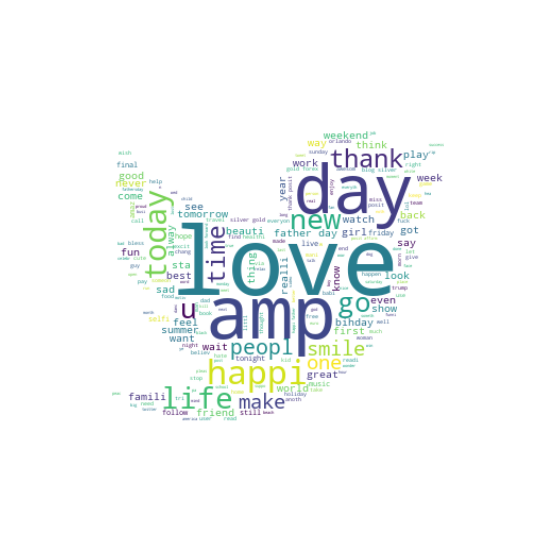

In [52]:
all_words = ' '.join([word for word in data_frame['clean_tweet']])
from wordcloud import WordCloud
wordcloud = WordCloud(mask = twitter_mask, background_color="white", width= twitter_mask.shape[2], height=600, random_state=21, max_font_size=110, stopwords= STOPWORDS).generate(all_words)
print('all words')
plt.figure(figsize=(10, 10))
plt.imshow(wordcloud, interpolation='bilinear',cmap='viridis')
plt.axis('off')
plt.show()

 Negative words in the corpus


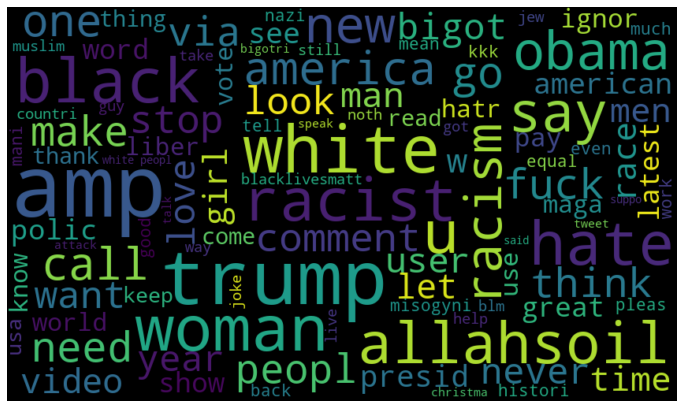

In [53]:


negative_words = ' '.join([word for word in data_frame['clean_tweet'][data_frame['label'] == 1]])
wordcloud = WordCloud(width = 850, height = 500, max_font_size = 110,max_words = 100, stopwords= STOPWORDS).generate(negative_words)
print(' Negative words in the corpus')
plt.figure(figsize= (12,8),facecolor = None)
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.show()


In [54]:
df_0 = data_frame['hash'][df['label'] == 0]
df_1 = data_frame['hash'][df['label'] == 1]



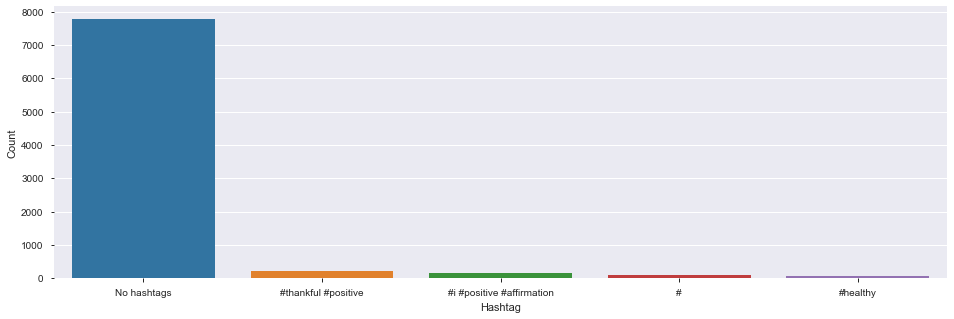

In [55]:
# Plotting positive hashtags 

a = nltk.FreqDist(df_0)
d = pd.DataFrame({'Hashtag': list(a.keys()),
                  'Count': list(a.values())})

d = d.nlargest(columns="Count", n = 5)
plt.figure(figsize=(16, 5))
ax = sns.barplot(data=d, x = "Hashtag", y="Count")
ax.set(ylabel = 'Count', xlabel = 'Hashtag')
plt.show()


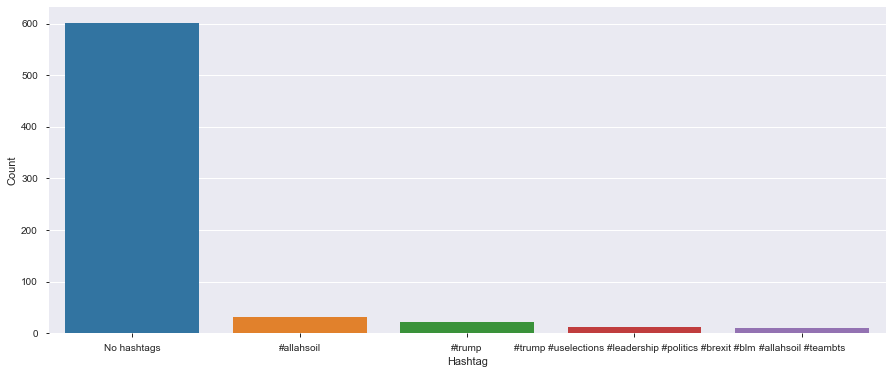

<Figure size 432x288 with 0 Axes>

In [56]:
# hate hastags


b = nltk.FreqDist(df_1)
e = pd.DataFrame({'Hashtag': list(b.keys()),
                  'Count': list(b.values())})

e = e.nlargest(columns="Count", n = 5)
plt.figure(figsize=(15, 6))
ax = sns.barplot(data=e, x = "Hashtag", y="Count")
ax.set(ylabel = 'Count')
fig = plt.figure()
plt.show()



In [57]:
import plotly.express as px
fig = px.bar(df_0, x="hash", y="hash")
                             
fig.show()

In [58]:
data_frame.head()

,id,label,tweet,clean_tweet,tokenize_tweet,hash
0,1,0,@user when a father is dysfunctional and is s...,father dysfunct selfish drag kid dysfunct #run,"[father, dysfunctional, selfish, drags, kids, ...",#run
1,2,0,@user @user thanks for #lyft credit i can't us...,thank #lyft credit use caus offer wheelchair v...,"[thanks, #, lyft, credit, use, cause, offer, w...",#lyft #disapointed #getthanked
2,3,0,bihday your majesty,bihday majesti,"[bihday, majesty]",No hashtags
3,4,0,#model i love u take with u all the time in ...,#model love u take u time ur,"[#, model, love, u, take, u, time, ur]",#model
4,5,0,factsguide: society now #motivation,factsguid societi #motiv,"[factsguide, society, #, motivation]",#motivation


In [59]:
pip install ffmpeg

Note: you may need to restart the kernel to use updated packages.


In [61]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [59]:
data_frame_X=data_frame["clean_tweet"]

In [60]:
data_frame_X

0           father dysfunct selfish drag kid dysfunct #run
1        thank #lyft credit use caus offer wheelchair v...
2                                           bihday majesti
3                             #model love u take u time ur
4                                 factsguid societi #motiv
                               ...                        
31956             fish tomorrow carnt wait first time year
31957                                        ate isz youuu
31958    see nina turner airwav tri wrap mantl genuin h...
31959             listen sad song monday morn otw work sad
31961                                         thank follow
Name: clean_tweet, Length: 29530, dtype: object

In [61]:
len(data_frame[data_frame.label==0])

27517

In [62]:
x1=data_frame['clean_tweet'].values.tolist()

In [63]:
x1

['father dysfunct selfish drag kid dysfunct #run',
 'thank #lyft credit use caus offer wheelchair van pdx #disapoint #getthank',
 'bihday majesti',
 '#model love u take u time ur',
 'factsguid societi #motiv',
 'huge fan fare big talk leav chao pay disput get #allshowandnogo',
 'camp tomorrow danni',
 'next school year year exam think #school #exam #hate #imagin #actorslif #revolutionschool #girl',
 'love land #allin #cav #champion #cleveland #clevelandcavali',
 'welcom #gr',
 '#ireland consum price index mom climb previou may #blog #silver #gold #forex',
 'selfish #orlando #standwithorlando #pulseshoot #orlandoshoot #biggerproblem #selfish #heabreak #valu #love #',
 'get see daddi today #day #gettingf',
 '#cnn call #michigan middl school build wall chant #tcot',
 'comment #australia #opkillingbay #seashepherd #helpcovedolphin #thecov #helpcovedolphin',
 'ouch junior angri #got #junior #yugyoem #omg',
 'thank paner #thank #posit',
 'retweet agre',
 '#friday smile around via ig user #co

In [64]:
from nltk.tokenize import word_tokenize 

In [65]:
new= [nltk.word_tokenize(clean_tweet) for clean_tweet in x1]

In [66]:
new

[['father', 'dysfunct', 'selfish', 'drag', 'kid', 'dysfunct', '#', 'run'],
 ['thank',
  '#',
  'lyft',
  'credit',
  'use',
  'caus',
  'offer',
  'wheelchair',
  'van',
  'pdx',
  '#',
  'disapoint',
  '#',
  'getthank'],
 ['bihday', 'majesti'],
 ['#', 'model', 'love', 'u', 'take', 'u', 'time', 'ur'],
 ['factsguid', 'societi', '#', 'motiv'],
 ['huge',
  'fan',
  'fare',
  'big',
  'talk',
  'leav',
  'chao',
  'pay',
  'disput',
  'get',
  '#',
  'allshowandnogo'],
 ['camp', 'tomorrow', 'danni'],
 ['next',
  'school',
  'year',
  'year',
  'exam',
  'think',
  '#',
  'school',
  '#',
  'exam',
  '#',
  'hate',
  '#',
  'imagin',
  '#',
  'actorslif',
  '#',
  'revolutionschool',
  '#',
  'girl'],
 ['love',
  'land',
  '#',
  'allin',
  '#',
  'cav',
  '#',
  'champion',
  '#',
  'cleveland',
  '#',
  'clevelandcavali'],
 ['welcom', '#', 'gr'],
 ['#',
  'ireland',
  'consum',
  'price',
  'index',
  'mom',
  'climb',
  'previou',
  'may',
  '#',
  'blog',
  '#',
  'silver',
  '#',
  'g

In [67]:
import gensim
from sklearn.decomposition import PCA

In [68]:
from gensim.models import Word2Vec
model =gensim.models.Word2Vec(new, workers=4,sg=1, window=5, min_count=3)
model.save("w_model")

In [69]:
model

In [70]:
model.corpus_count

29530

In [71]:
model.train(new, epochs=5, total_examples= 29530)

(1001784, 1511275)

In [72]:

model.wv['trump']

array([ 5.83219789e-02,  3.87843698e-01,  4.80617583e-01,  9.45389047e-02,
        4.71370548e-01, -6.57008588e-01,  2.93107927e-01,  1.82042316e-01,
       -5.56095541e-01,  5.58880150e-01, -5.71848154e-01,  2.42663562e-01,
       -5.52095115e-01, -3.74015182e-01,  9.20562565e-01, -3.34625810e-01,
       -1.82208389e-01, -7.75611475e-02,  2.88226992e-01, -5.22276402e-01,
       -1.72615811e-01,  6.61113441e-01, -9.55013260e-02,  6.43881023e-01,
       -3.60104471e-01, -1.98771179e-01, -3.47140729e-01, -7.61912644e-01,
        2.59439707e-01,  4.35176849e-01,  2.12635145e-01,  1.63312390e-01,
       -3.02394181e-01, -3.62287194e-01,  4.97031450e-01,  9.81167972e-01,
        4.87267748e-02, -6.88999951e-01,  4.91409078e-02, -4.54659641e-01,
        1.87161431e-01, -7.29437113e-01, -3.68934474e-03, -7.68317282e-03,
       -5.87064074e-04,  1.43959686e-01, -2.42782682e-02, -4.36886679e-03,
       -1.09299533e-02, -5.71710885e-01,  4.02434826e-01,  6.98145211e-01,
        1.09939650e-01, -

In [73]:
model.wv.most_similar('trump')

[('hillari', 0.7343162298202515),
 ('bigot', 0.7245920896530151),
 ('donald', 0.7201839685440063),
 ('obama', 0.7176686525344849),
 ('racist', 0.706204891204834),
 ('polit', 0.7022185921669006),
 ('putin', 0.7020806670188904),
 ('campaign', 0.701357901096344),
 ('vote', 0.6902296543121338),
 ('donaldtrump', 0.6857871413230896)]

In [74]:
model.wv.similarity('food', 'fish')

0.5086368

In [75]:
#Bag of words Countvectorizer

from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer( analyzer='word', max_features=1000, min_df=2)
# tokenize and build vocab

TM=cv.fit_transform(x1)

In [76]:
TM.shape

(29530, 1000)

In [77]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer( min_df=1, max_features=2500,stop_words='english')
TTF= tfidf.fit_transform(data_frame['clean_tweet'].tolist())



In [78]:
#for lda
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf2 = TfidfVectorizer( min_df=1, max_features=2500,stop_words='english')
TTF2= tfidf2.fit_transform(data_frame['clean_tweet'].tolist())

In [79]:
print(tfidf.vocabulary_)

{'father': 795, 'selfish': 1961, 'drag': 647, 'kid': 1230, 'run': 1912, 'thank': 2218, 'credit': 515, 'use': 2336, 'caus': 361, 'offer': 1571, 'bihday': 224, 'model': 1470, 'love': 1360, 'time': 2243, 'ur': 2333, 'factsguid': 772, 'societi': 2052, 'motiv': 1485, 'huge': 1096, 'fan': 784, 'big': 218, 'talk': 2184, 'leav': 1287, 'pay': 1630, 'camp': 337, 'tomorrow': 2255, 'school': 1940, 'year': 2481, 'exam': 742, 'think': 2225, 'hate': 1028, 'imagin': 1125, 'girl': 932, 'land': 1257, 'cav': 362, 'champion': 372, 'cleveland': 415, 'welcom': 2411, 'gr': 968, 'ireland': 1180, 'consum': 478, 'price': 1730, 'index': 1137, 'mom': 1471, 'climb': 418, 'previou': 1729, 'blog': 248, 'silver': 2009, 'gold': 942, 'forex': 861, 'orlando': 1595, 'orlandoshoot': 1597, 'heabreak': 1033, 'valu': 2342, 'daddi': 541, 'today': 2248, 'day': 556, 'cnn': 428, 'middl': 1448, 'build': 313, 'wall': 2381, 'tcot': 2194, 'comment': 448, 'australia': 141, 'junior': 1221, 'angri': 86, 'got': 962, 'omg': 1580, 'paner'

In [80]:
print(TTF)

  (0, 1912)	0.3971336570694245
  (0, 1230)	0.3762483561142648
  (0, 647)	0.5416435399248097
  (0, 1961)	0.5604229096544668
  (0, 795)	0.3054021462532974
  (1, 1571)	0.4934855328816356
  (1, 361)	0.4473984479763803
  (1, 2336)	0.3934800151021275
  (1, 515)	0.5587004862550198
  (1, 2218)	0.2988877748561961
  (2, 224)	1.0
  (3, 2333)	0.5843656745956823
  (3, 2243)	0.40408121777617173
  (3, 1360)	0.3105400125937819
  (3, 1470)	0.631506158618515
  (4, 1485)	0.45561738745788183
  (4, 2052)	0.5917577283169025
  (4, 772)	0.6650079602706069
  (5, 1630)	0.36165299259336753
  (5, 1287)	0.39740921530204243
  (5, 2184)	0.3997052405021405
  (5, 218)	0.38863363312733934
  (5, 784)	0.40582949068821805
  (5, 1096)	0.48556675436688257
  (6, 2255)	0.5865759552259215
  :	:
  (29523, 633)	0.3721278097143777
  (29523, 314)	0.660399726899784
  (29524, 1107)	0.6900137603535086
  (29524, 1276)	0.5822467763689987
  (29524, 2405)	0.4299647682435389
  (29525, 830)	0.6226287413635845
  (29525, 2376)	0.386478950219

In [81]:
TTF.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [82]:
tfidf.get_feature_names()

['aap',
 'abl',
 'absolut',
 'abt',
 'abus',
 'accept',
 'access',
 'accessori',
 'accid',
 'account',
 'accus',
 'ace',
 'ach',
 'achiev',
 'act',
 'action',
 'activ',
 'actor',
 'actress',
 'actual',
 'ad',
 'adam',
 'adapt',
 'add',
 'addict',
 'address',
 'adel',
 'admit',
 'ador',
 'adult',
 'advanc',
 'adveis',
 'adventur',
 'advic',
 'af',
 'affect',
 'affirm',
 'afford',
 'afraid',
 'africa',
 'african',
 'afternoon',
 'age',
 'agenda',
 'ago',
 'agre',
 'ah',
 'ahead',
 'aicl',
 'aim',
 'air',
 'airpo',
 'aist',
 'aka',
 'al',
 'alarm',
 'album',
 'alcohol',
 'ale',
 'alex',
 'ali',
 'aliv',
 'allah',
 'allahsoil',
 'alli',
 'allig',
 'allow',
 'alon',
 'alreadi',
 'alt',
 'altright',
 'altwaystoh',
 'alway',
 'amaz',
 'amazon',
 'amen',
 'america',
 'american',
 'amp',
 'amsterdam',
 'amwrit',
 'anal',
 'analyt',
 'android',
 'angel',
 'anger',
 'angri',
 'anim',
 'anna',
 'anniversari',
 'announc',
 'annoy',
 'annual',
 'anoth',
 'answer',
 'anti',
 'antisemit',
 'anton',
 '

In [83]:
TTF[28]

<1x2500 sparse matrix of type '<class 'numpy.float64'>'
	with 3 stored elements in Compressed Sparse Row format>

In [84]:
tfidf.inverse_transform(TTF[28])

[array(['happi', 'day', 'father'], dtype='<U22')]

In [85]:
x1[28]

'happi father day'

In [86]:
import gensim
import pprint
from gensim import corpora



dictionary = corpora.Dictionary(new)
bow_corpus = [dictionary.doc2bow(document, allow_update=True) for document in new]
for document in bow_corpus:
   print([[dictionary[id], freq] for id, freq in document])
import numpy as np
tfidf = models.TfidfModel(bow_corpus, smartirs='ntc')
tf= tfidf[bow_corpus]
for document in tf[bow_corpus]:
   print([[dictionary[id], np.around(freq,decomal=2)] for id, freq in doc])

[['#', 1], ['drag', 1], ['dysfunct', 2], ['father', 1], ['kid', 1], ['run', 1], ['selfish', 1]]
[['#', 3], ['caus', 1], ['credit', 1], ['disapoint', 1], ['getthank', 1], ['lyft', 1], ['offer', 1], ['pdx', 1], ['thank', 1], ['use', 1], ['van', 1], ['wheelchair', 1]]
[['bihday', 1], ['majesti', 1]]
[['#', 1], ['love', 1], ['model', 1], ['take', 1], ['time', 1], ['u', 2], ['ur', 1]]
[['#', 1], ['factsguid', 1], ['motiv', 1], ['societi', 1]]
[['#', 1], ['allshowandnogo', 1], ['big', 1], ['chao', 1], ['disput', 1], ['fan', 1], ['fare', 1], ['get', 1], ['huge', 1], ['leav', 1], ['pay', 1], ['talk', 1]]
[['camp', 1], ['danni', 1], ['tomorrow', 1]]
[['#', 7], ['actorslif', 1], ['exam', 2], ['girl', 1], ['hate', 1], ['imagin', 1], ['next', 1], ['revolutionschool', 1], ['school', 2], ['think', 1], ['year', 2]]
[['#', 5], ['love', 1], ['allin', 1], ['cav', 1], ['champion', 1], ['cleveland', 1], ['clevelandcavali', 1], ['land', 1]]
[['#', 1], ['gr', 1], ['welcom', 1]]
[['#', 5], ['blog', 1], ['cli

[['#', 3], ['come', 1], ['delight', 1], ['monsoon', 1], ['mumbairain', 1]]
[['#', 1], ['today', 1], ['away', 1], ['amp', 1], ['sign', 1], ['home', 2], ['find', 1], ['wear', 1], ['fall', 1], ['gamma', 1], ['kappa', 2], ['recruit', 1]]
[['day', 1], ['b', 1], ['sweet', 1], ['johnni', 1]]
[['#', 1], ['made', 1], ['man', 1], ['famili', 1], ['readi', 1], ['fathersday', 1], ['dream', 1], ['bachelorhood', 1], ['sacrif', 1]]
[['hard', 1], ['name', 1], ['woman', 1], ['teen', 1], ['fuck', 1]]
[['#', 2], ['time', 1], ['get', 1], ['think', 1], ['peopl', 1], ['say', 1], ['good', 2], ['alway', 1], ['hea', 2]]
[['school', 1], ['finish', 1], ['almost', 1]]
[['ofcours', 1]]
[['#', 8], ['omg', 1], ['goal', 1], ['video', 1], ['ador', 1], ['vine', 1], ['cute', 1], ['ever', 1], ['babi', 1], ['puppi', 1], ['aw', 1], ['cutebabi', 1], ['cutest', 1]]
[['#', 4], ['agre', 1], ['w', 2], ['much', 1], ['way', 1], ['trump', 1], ['win', 1], ['hrc', 1], ['ca', 1], ['popularvot', 1]]
[['#', 12], ['girl', 1], ['hello', 1

[['#', 1], ['love', 1], ['smile', 1], ['amp', 1], ['happi', 1], ['hard', 1], ['one', 1], ['job', 1], ['remain', 1], ['fail', 1]]
[['#', 3], ['love', 1], ['everi', 2], ['disney', 1], ['minut', 1], ['everyday', 1], ['elimin', 1], ['dumb', 1], ['better', 1], ['gator', 1], ['pond', 1], ['constantli', 1], ['gatorsquad', 1]]
[['#', 2], ['thank', 2], ['posit', 1], ['apolog', 1]]
[['#', 6], ['happi', 2], ['redhead', 3], ['sex', 1], ['nude', 1], ['porn', 1], ['pron', 1], ['amateur', 1]]
[['like', 1], ['darl', 1]]
[['#', 5], ['love', 1], ['huge', 1], ['beauti', 1], ['life', 1], ['music', 1], ['impact', 1], ['likeforlik', 1], ['pac', 1], ['followforfollow', 1]]
[['#', 4], ['kid', 1], ['summeim', 1], ['summer', 2], ['joy', 1], ['toddler', 1], ['smore', 1]]
[['#', 2], ['take', 1], ['look', 1], ['new', 1], ['outdoor', 1], ['recept', 1], ['shape', 1], ['area', 1], ['eyf', 1], ['outdoorlearn', 1]]
[['societi', 1], ['today', 1], ['pictur', 1]]
[['#', 2], ['father', 1], ['love', 1], ['day', 1], ['user',

[['#', 2], ['happi', 1], ['work', 2], ['cultur', 1], ['develop', 1], ['lead', 1], ['mindset', 2], ['organ', 1], ['right', 1], ['c', 1], ['onfer', 1]]
[['#', 4], ['retweet', 1], ['amp', 1], ['like', 1], ['feel', 1], ['black', 1], ['listen', 1], ['miami', 1], ['stomp', 1], ['tampa', 1]]
[['#', 3], ['night', 1], ['fight', 1], ['bellanca', 1], ['foodonground', 1], ['kayla', 1], ['pj', 1], ['rug', 1]]
[['#', 11], ['fan', 1], ['funni', 1], ['go', 1], ['show', 1], ['t', 1], ['shock', 1], ['kiss', 1], ['script', 2], ['guest', 2], ['puppet', 1], ['bot', 1], ['elmo', 1]]
[['#', 5], ['blog', 1], ['forex', 1], ['gold', 1], ['may', 1], ['silver', 1], ['chang', 1], ['k', 2], ['employ', 1], ['actual', 1], ['canada', 1], ['forecast', 1], ['net', 1]]
[['#', 5], ['angri', 1], ['blue', 1], ['feel', 1], ['game', 1], ['hungri', 1], ['shark', 2], ['android', 1], ['gplay', 1], ['rage', 1], ['sony', 1]]
[['#', 6], ['drink', 1], ['one', 1], ['tuesday', 1], ['road', 1], ['nightout', 1], ['dadanddaught', 1], ['s

[['#', 1], ['bull', 2], ['direct', 1], ['domin', 1], ['want', 1], ['whatev', 1], ['yo', 1], ['zaynmalik', 1]]
[['#', 2], ['hour', 1], ['readi', 1], ['full', 1], ['releas', 1], ['dead', 1], ['deadbydaylight', 1], ['daylight', 1], ['gonnagetkil', 1]]
[['#', 4], ['retweet', 1], ['amp', 1], ['like', 1], ['feel', 1], ['black', 1], ['listen', 1], ['miami', 1], ['stomp', 1], ['tampa', 1]]
[['#', 1], ['need', 2], ['tear', 1], ['gorilla', 1], ['citi', 1], ['adapt', 1], ['environ', 1], ['simul', 1], ['mater', 1], ['flipclass', 1]]
[['#', 4], ['need', 1], ['tweet', 1], ['hashtag', 1], ['funandgam', 1], ['lessthananhouosta', 1], ['wherescoop', 1], ['whereswaldo', 1]]
[['#', 2], ['thank', 1], ['back', 1], ['bring', 1], ['season', 1], ['oitnb', 1]]
[['ali', 1], ['wish', 1], ['gt', 1], ['holiday', 1], ['tmak', 1]]
[['#', 2], ['girl', 1], ['today', 1], ['littl', 1], ['like', 1], ['best', 1], ['cours', 1], ['sorri', 1], ['whoop', 2], ['mega', 1]]
[['#', 1], ['might', 1], ['intrigu', 1], ['maryebrew', 1

[['like', 1], ['go', 2], ['anywher', 1], ['fuck', 1], ['richi', 1]]
[['#', 5], ['thank', 1], ['happi', 1], ['life', 1], ['moment', 2], ['grate', 1]]
[['way', 1], ['yaaaaaaaaaass', 1]]
[['#', 1], ['welcom', 1], ['monday', 1]]
[['#', 1], ['time', 1], ['today', 1], ['beauti', 1], ['amaz', 1], ['meet', 1], ['come', 1], ['town', 1], ['hall', 1], ['stori', 1], ['august', 1], ['fringenyc', 1]]
[['#', 5], ['love', 1], ['time', 1], ['good', 1], ['selfi', 1], ['me', 1], ['babi', 1], ['weird', 1], ['dark', 1], ['likeit', 1]]
[['#', 1], ['today', 1], ['final', 1], ['go', 1], ['gon', 1], ['na', 1], ['sta', 1], ['eye', 1], ['rest', 1], ['dc', 1], ['trip', 1], ['roadtrip', 1], ['colonel', 1]]
[['get', 1], ['old', 1], ['help', 1], ['forgot', 1], ['acc', 1], ['password', 1], ['folow', 1]]
[['#', 1], ['go', 1], ['back', 1], ['moment', 1], ['would', 1], ['anyth', 1], ['amsterdam', 1]]
[['#', 3], ['time', 1], ['happi', 1], ['feel', 1], ['music', 1], ['put', 1], ['give', 1], ['answer', 1], ['soul', 1], ['w

[['#', 1], ['day', 1], ['st', 1], ['confer', 1], ['woman', 1], ['date', 1], ['hold', 1], ['launch', 1], ['full', 1], ['detail', 1], ['nov', 1], ['wearetech', 1], ['womenintech', 1]]
[['#', 3], ['father', 2], ['thank', 1], ['day', 1], ['fathersday', 1], ['career', 1], ['strength', 1], ['gent', 1], ['guidanc', 1]]
[['#', 1], ['father', 1], ['u', 1], ['hate', 1], ['free', 1], ['racist', 1], ['care', 1], ['r', 1], ['give', 1], ['as', 1], ['child', 1], ['press', 1], ['poster', 1], ['wtf', 1], ['clown', 1], ['abt', 1], ['tmzlive', 1]]
[['#', 1], ['get', 1], ['volunt', 1], ['involv', 1]]
[['#', 2], ['night', 1], ['date', 1], ['ballet', 1], ['sleepingbeauti', 1]]
[['#', 1], ['thank', 1], ['latest', 1], ['daili', 1], ['remot', 1], ['indigen', 1], ['justjustic', 1]]
[['love', 1], ['see', 1], ['great', 1], ['night', 1], ['last', 1], ['guy', 1], ['set', 1], ['stoke', 1], ['august', 1], ['proper', 1]]
[['#', 4], ['love', 1], ['today', 1], ['peopl', 1], ['amaz', 1], ['success', 1], ['train', 1], ['a

[['#', 5], ['omg', 1], ['xd', 1], ['haha', 1], ['funim', 1], ['badblood', 1], ['heh', 1], ['lel', 1]]
[['#', 3], ['white', 1], ['black', 1], ['chang', 1], ['trump', 1], ['flight', 1], ['kkk', 1], ['derek', 1]]
[['#', 2], ['today', 1], ['via', 1], ['amaz', 1], ['sta', 1], ['challeng', 1], ['fabric', 1], ['monthli', 1], ['maker', 1], ['miy', 1]]
[['#', 1], ['thank', 1], ['write', 2], ['sho', 1], ['inspir', 1], ['tri', 1], ['creativ', 1], ['stori', 1], ['podcast', 1], ['began', 1]]
[['#', 16], ['pay', 1], ['girl', 1], ['selfi', 1], ['fun', 1], ['instagood', 1], ['saturday', 1], ['summer', 1], ['sun', 1], ['b', 1], ['babi', 1], ['glass', 1], ['sunset', 1], ['holiday', 1], ['rain', 1], ['bore', 1], ['tree', 1], ['candl', 1], ['all', 1]]
[['pay', 1], ['l', 1], ['almost', 1], ['brought', 1], ['bacardi', 1], ['limon', 1]]
[['#', 1], ['bihday', 1], ['post', 1], ['instagram', 1], ['ashish', 1], ['toofan', 1]]
[['littl', 1], ['st', 1], ['game', 1], ['cousin', 1], ['grader', 1]]
[['#', 1], ['get',

[['father', 3], ['day', 2], ['still', 1], ['bless', 1], ['present', 2], ['ahead', 1]]
[['#', 1], ['got', 1], ['instead', 1], ['green', 1], ['order', 1], ['cheat', 1], ['websit', 1], ['oliv', 1], ['pea', 1], ['display', 1], ['salad', 1]]
[['#', 3], ['school', 1], ['today', 1], ['happi', 1], ['proud', 1], ['daughter', 1], ['tear', 1], ['graduat', 1], ['grammar', 1]]
[['#', 2], ['win', 1], ['list', 1], ['restaur', 1], ['award', 1], ['winner', 1], ['canadian', 1], ['highest', 1], ['listflaw', 1], ['newcom', 1], ['tuningout', 1]]
[['#', 4], ['amp', 1], ['book', 1], ['chang', 1], ['total', 1], ['outlin', 1], ['chapter', 1], ['nail', 1], ['amwrit', 1], ['beta', 1], ['reader', 1], ['amedit', 1], ['firstnovel', 1]]
[['#', 1], ['see', 1], ['smile', 1], ['wait', 1], ['til', 1], ['mariamiguel', 1]]
[['#', 1], ['lead', 1], ['william', 1], ['gt', 1], ['promis', 1], ['arrest', 1], ['nyc', 1], ['top', 1], ['small', 1], ['nation', 1], ['clueless', 1], ['cop', 1], ['marijuana', 1], ['bratton', 1]]
[['#'

[['#', 1], ['watch', 1], ['soon', 1], ['conjur', 1]]
[['#', 4], ['media', 1], ['tech', 1], ['agentsofshield', 1], ['girlsinsteam', 1], ['paley', 1]]
[['#', 2], ['candid', 1], ['never', 1], ['presidenti', 1], ['republican', 1], ['question', 1], ['true', 1], ['az', 1], ['ga', 1], ['believem', 1], ['rin', 1], ['ut', 1]]
[['#', 4], ['hate', 1], ['amp', 2], ['like', 1], ['seem', 1], ['ignor', 1], ['realiti', 1], ['divid', 1], ['scienc', 1], ['cdnpoli', 1], ['canadianvalu', 1], ['weaken', 1]]
[['orlando', 1], ['gt', 1], ['mother', 1], ['puls', 1], ['justic', 1], ['confirm', 1], ['dead', 1], ['eddi', 1], ['sent', 1], ['text', 1], ['nightclubb', 1]]
[['thank', 1], ['bihday', 1], ['beauti', 1], ['one', 1], ['begin', 1], ['journey', 1], ['alway', 1], ['wish', 1], ['ht', 1], ['special', 1], ['reflect', 1]]
[['year', 1], ['w', 1], ['last', 1], ['claim', 1], ['anoth', 1], ['cross', 1], ['hitchen', 1], ['path', 1], ['religion', 1], ['supposedli', 1], ['taunton', 1], ['dea', 1]]
[['anymor', 1], ['idc

[['#', 2], ['father', 1], ['mom', 1], ['day', 1], ['amaz', 1], ['includ', 1], ['lt', 1], ['shoe', 1], ['parent', 1], ['fill', 1]]
[['#', 2], ['twitter', 1], ['myfirsttweet', 1]]
[['#', 3], ['u', 1], ['rip', 1], ['shoot', 1], ['histori', 1], ['ripchristina', 1], ['worst', 1], ['tragic', 1], ['mass', 1]]
[['#', 1], ['take', 1], ['way', 1], ['home', 1], ['simul', 1], ['buffalo', 2], ['vicin', 1], ['yo', 1], ['seattl', 1]]
[['u', 1], ['realli', 1], ['miss', 1], ['inde', 1]]
[['long', 1]]
[['cnn', 1], ['amp', 1], ['cours', 1], ['ppl', 1], ['address', 1], ['lie', 1], ['b', 1], ['real', 1], ['die', 1], ['truth', 1], ['meanwhil', 1], ['hrc', 1], ['bo', 1], ['sicken', 1], ['kp', 1]]
[['#', 9], ['funni', 1], ['ador', 1], ['lol', 1], ['loveit', 1], ['dev', 1], ['introduct', 1], ['instacut', 1], ['instafun', 1], ['msqrd', 1], ['toocut', 1]]
[['#', 3], ['time', 1], ['like', 1], ['last', 1], ['ask', 1], ['someon', 1], ['act', 1], ['meme', 2], ['relat', 1], ['hidethepainharold', 1]]
[['#', 2], ['take

[['#', 2], ['see', 1], ['go', 1], ['im', 1], ['find', 1], ['dori', 1], ['findingdori', 1], ['fishfriday', 1]]
[['#', 1], ['tomorrow', 1], ['today', 1], ['know', 1], ['happi', 1], ['never', 1], ['bring', 1], ['makeachang', 1]]
[['#', 5], ['happen', 1], ['season', 1], ['oitnb', 1], ['cantwait', 1], ['orangeisthenewblack', 1], ['watchingitnow', 1]]
[['#', 1], ['nice', 1], ['doctor', 1]]
[['#', 1], ['next', 1], ['readi', 1], ['week', 1], ['check', 1], ['holiday', 1], ['onlin', 1]]
[['angri', 1], ['man', 1], ['guy', 1], ['ignor', 1], ['lunat', 1], ['viciou', 1]]
[['black', 1], ['gun', 1], ['woman', 1], ['custom', 1], ['pointer', 1], ['fl', 1], ['aim', 1], ['scream', 1], ['racial', 1], ['slur', 1], ['mcdonald', 1], ['laser', 1]]
[['#', 3], ['see', 1], ['happi', 1], ['employe', 1], ['uk', 2], ['compani', 1], ['inn', 1], ['hong', 2], ['ltd', 1], ['wang', 2], ['yun', 1]]
[['#', 2], ['see', 1], ['amp', 1], ['chang', 1], ['pic', 1], ['american', 1], ['mani', 2], ['dead', 1], ['profil', 2], ['amer

[['#', 1], ['think', 1], ['keep', 1], ['tire', 1], ['explain', 1], ['confus', 1], ['hardmoment', 1], ['hidup', 1], ['lucu', 1], ['sungguh', 1]]
[['#', 2], ['made', 1], ['sad', 1], ['lotteri', 1], ['grandma', 2]]
[['super', 1]]
[['#', 2], ['thank', 2], ['posit', 1], ['music', 1]]
[['#', 3], ['see', 1], ['go', 1], ['saturday', 1], ['awesom', 1], ['girlpow', 1], ['singersongwrit', 1]]
[['#', 3], ['offer', 1], ['cours', 1], ['gon', 1], ['na', 1], ['snowflak', 1], ['orgasm', 1], ['blatantli', 1], ['problemofwhit', 1], ['universityofwisconsinmadison', 1]]
[['via', 1], ['open', 1], ['public', 1], ['app', 1], ['funer', 1], ['visit', 1], ['gordi', 1], ['howe', 1]]
[['#', 2], ['thank', 2], ['posit', 1], ['sunris', 1]]
[['#', 7], ['piss', 1], ['one', 1], ['fun', 1], ['gg', 1], ['fav', 1], ['flashbackfriday', 1], ['waterspo', 1], ['girlspe', 1], ['vipissi', 1]]
[['thank', 1], ['u', 1], ['ian', 1]]
[['father', 1], ['day', 1]]
[['love', 1], ['u', 1], ['pm', 1], ['sta', 1], ['send', 1], ['would', 1],

[['#', 8], ['via', 1], ['play', 1], ['car', 1], ['amazon', 1], ['nitro', 1], ['truck', 2], ['ga', 1], ['miniatur', 1], ['rc', 1], ['wd', 2], ['hsp', 2], ['toyspot', 1], ['miniwd', 1]]
[['#', 1], ['leav', 1], ['bull', 1], ['strong', 1], ['fact', 1], ['attack', 1], ['despit', 1], ['chase', 1], ['lot', 1], ['sourc', 1], ['mileycyrusedit', 1]]
[['time', 1], ['look', 1], ['monday', 1], ['go', 1], ['first', 1], ['hope', 1], ['ever', 1], ['forward', 1], ['woh', 1], ['trip', 1], ['round', 1], ['mile', 1]]
[['#', 1], ['peopl', 1], ['need', 1], ['scare', 1], ['full', 1], ['fear', 1], ['shout', 1], ['sofa', 1], ['outnumb', 1]]
[['championship', 1], ['park', 1], ['british', 1], ['sponsor', 1], ['august', 1], ['novic', 1], ['gatcomb', 1]]
[['year', 1], ['stop', 1], ['happen', 1], ['shoot', 1], ['done', 1], ['countri', 1], ['noth', 1], ['damn', 1], ['later', 1], ['liter', 1], ['four', 1]]
[['morn', 1], ['life', 1], ['relax', 1], ['impoant', 1], ['afternoon', 1], ['food', 1], ['person', 1], ['amazing

[['fan', 1], ['user', 1], ['album', 1], ['entir', 1], ['base', 1], ['alien', 1], ['tale', 1], ['cautionari', 1]]
[['#', 1], ['sad', 1], ['want', 1], ['sick', 1], ['woman', 2], ['presid', 1], ['b', 1], ['c', 1], ['major', 1], ['democrat', 1], ['gender', 1], ['ohio', 1], ['concept', 1]]
[['#', 1], ['mean', 1], ['world', 1], ['live', 1], ['aw', 1], ['scaredfohefutur', 1]]
[['#', 1], ['thank', 1], ['safe', 1], ['concern', 1], ['everybodi', 1], ['sound', 1], ['beirutwelovey', 1]]
[['#', 1], ['u', 1], ['got', 1], ['peopl', 1], ['hu', 1], ['friend', 1], ['crash', 1], ['doubt', 1], ['normal', 1], ['rel', 1], ['highli', 1], ['bcpoli', 1]]
[['#', 1], ['leav', 1], ['bull', 1], ['strong', 1], ['fact', 1], ['attack', 1], ['food', 1], ['despit', 1], ['chase', 1], ['lot', 1], ['sourc', 1], ['natur', 1]]
[['#', 5], ['pay', 1], ['friday', 1], ['peopl', 2], ['happi', 1], ['weekend', 1], ['goodtim', 1], ['guy', 1], ['wise', 1], ['wiseguy', 1]]
[['weekend', 1], ['go', 1], ['interest', 1], ['wed', 1], ['tr

[['#', 3], ['media', 1], ['health', 1], ['creativ', 1], ['a', 1], ['mental', 1], ['psycholog', 1], ['disord', 1], ['link', 1]]
[['mind', 1], ['watch', 1], ['broken', 1], ['netflix', 1], ['bing', 1], ['cant', 1], ['crimin', 1], ['laptop', 1]]
[['#', 1], ['via', 1], ['want', 1], ['morn', 1], ['one', 1], ['everi', 1], ['ask', 1], ['question', 1], ['success', 1]]
[['#', 4], ['healthi', 1], ['anoth', 1], ['fit', 1], ['total', 1], ['loveit', 1], ['lb', 1], ['aaand', 1], ['goingveggi', 1]]
[['#', 1], ['get', 1], ['day', 1], ['sta', 1], ['footbal', 1], ['gut', 1], ['luck', 1], ['continu', 1], ['aw', 1], ['beaten', 1]]
[['#', 1], ['wait', 2], ['watch', 1], ['long', 1], ['movi', 1], ['findingdori', 1]]
[['#', 3], ['posit', 1], ['affirm', 1], ['i', 1], ['exquisit', 1]]
[['#', 7], ['today', 1], ['garden', 1], ['healthi', 1], ['harvest', 1], ['veggi', 2], ['veget', 2]]
[['#', 2], ['time', 1], ['amp', 1], ['g', 1], ['cottag', 1], ['lifeisgood', 1]]
[['bihday', 1], ['man', 1], ['nake', 1], ['woman', 

[['#', 7], ['time', 1], ['great', 1], ['bu', 1], ['lifestyl', 1], ['london', 1], ['foodi', 1], ['bblogger', 1], ['afternoontea', 1], ['summersixteentour', 1]]
[['get', 1], ['like', 1], ['stop', 1], ['gun', 1], ['kill', 1], ['mani', 1], ['pleas', 1], ['sale', 1]]
[['#', 2], ['happi', 1], ['choos', 1], ['personaldevelop', 1], ['homebusi', 1]]
[['#', 2], ['play', 1], ['pearljam', 1], ['songpop', 1]]
[['#', 6], ['love', 1], ['ace', 1], ['friend', 1], ['bless', 1], ['water', 1], ['coffe', 2], ['spa', 1], ['pamper', 1], ['ulit', 1], ['addict', 1]]
[['#', 1], ['today', 1], ['look', 1], ['like', 1], ['play', 1], ['rain', 3], ['birmingham', 1]]
[['#', 3], ['get', 1], ['includ', 1], ['sta', 1], ['read', 1], ['fridayfeel', 1], ['submiss', 1], ['opencal', 1]]
[['amp', 1], ['done', 1], ['flight', 1], ['nearli', 1], ['frustrat', 1], ['hr', 1], ['delay', 1]]
[['day', 1], ['tonight', 1], ['meet', 1], ['lee', 1], ['tri', 1], ['accompani', 1], ['zihao', 1]]
[['#', 4], ['consum', 1], ['day', 1], ['market

[['#', 1], ['back', 1], ['follow', 1], ['toni', 1], ['psych', 1], ['todd', 1]]
[['#', 7], ['send', 1], ['follow', 2], ['gt', 3], ['full', 1], ['ashiq', 1], ['faraz', 1], ['galib', 1], ['iqbal', 1], ['karen', 1], ['ki', 1], ['log', 1], ['mohsin', 1], ['poetri', 1], ['sirf', 1], ['wasi', 1], ['sagar', 1], ['shairi', 1]]
[['#', 1], ['offer', 1], ['thank', 1], ['look', 1], ['super', 1], ['realli', 1], ['believ', 1], ['fast', 1], ['prize', 1], ['trainer', 1], ['ulverstontri', 1]]
[['not', 1], ['wait', 1], ['can', 1], ['rain', 1]]
[['#', 2], ['bihday', 1], ['love', 1], ['day', 1], ['famili', 1], ['wish', 1], ['also', 1], ['icebe', 1], ['lynbuon', 1]]
[['#', 3], ['ur', 1], ['motiv', 1], ['book', 1], ['mondaymorn', 1], ['class', 1], ['yoga', 1], ['wk', 1]]
[['u', 1], ['realli', 1], ['miss', 1], ['guy', 1], ['cri', 1], ['gosh', 1], ['oww', 1]]
[['#', 1], ['today', 1], ['first', 1], ['travel', 1], ['fli', 1], ['class', 1], ['surpris', 1], ['upgrad', 1], ['pleasantli', 1]]
[['tree', 1], ['neighbo

[['omg', 1], ['make', 1], ['network', 1], ['up', 1], ['letter', 1], ['keep', 1], ['mani', 1], ['track', 1], ['warm', 1], ['spo', 1], ['stephen', 1], ['basket', 1], ['curri', 1]]
[['#', 4], ['love', 1], ['happi', 1], ['hea', 1], ['dear', 1], ['harri', 1], ['d', 1], ['onedirect', 1], ['dfana', 1], ['harrystyl', 1]]
[['#', 6], ['word', 1], ['temecula', 1], ['chalka', 1], ['chalkfest', 1], ['inspirationala', 1], ['oldtowntemecula', 1], ['temeculaafestiv', 1]]
[['#', 1], ['time', 1], ['see', 1], ['hard', 1], ['god', 1], ['pleas', 1], ['face', 1], ['current', 1], ['tdigcomm', 1]]
[['get', 1], ['weekend', 1], ['relax', 1], ['busi', 1]]
[['#', 6], ['father', 1], ['love', 1], ['day', 1], ['guy', 1], ['you', 1], ['hame', 1], ['newpo', 1], ['saba', 1]]
[['time', 1], ['get', 1], ['amp', 1], ['go', 1], ['food', 1], ['tire', 1], ['hungri', 1], ['af', 2], ['ambit', 1]]
[['#', 4], ['friday', 2], ['happi', 1], ['good', 1], ['lost', 1], ['direct', 1], ['feel', 1], ['right', 1], ['enjoy', 2], ['walk', 1]

NameError: name 'models' is not defined

In [87]:
 #unique words 
dictionary.num_nnz

486342

In [88]:
import gensim

In [89]:
from gensim.models.ldamulticore import LdaMulticore
from gensim import corpora, models

In [90]:

# Building LDA model
lda_model= gensim.models.ldamulticore.LdaMulticore(corpus=bow_corpus, id2word=dictionary, num_topics=100, random_state=100,
                chunksize=1000, passes=50,iterations=100,  eval_every = 1,minimum_probability=0)

In [133]:
from sklearn.decomposition import LatentDirichletAllocation

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, accuracy_score,precision_score, recall_score, confusion_matrix, classification_report

In [134]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf2 = TfidfVectorizer( min_df=1, max_features=2500,stop_words='english')
TTF2= tfidf2.fit_transform(data_frame['clean_tweet'].tolist())

In [135]:
from sklearn.model_selection import train_test_split

In [136]:
Xx_train, Xx_test, Yy_train, Yy_test = train_test_split(TTF2,data_frame['label'], test_size = 0.20, random_state = 0)

In [137]:
#LDA for classification

lda = LatentDirichletAllocation(n_components=10, random_state=0)
X_lda = lda.fit_transform(TTF2)


In [138]:
LRr = LogisticRegression( random_state=0, penalty='l2', solver='newton-cg')
LRr.fit(Xx_train, Yy_train)

LogisticRegression(random_state=0, solver='newton-cg')

In [139]:
yyypred = LRr.predict(Xx_test)

In [140]:
f1_score(Yy_test,yyypred)

0.4588235294117648

In [141]:
accuracy_score(Yy_test,yyypred)

0.9532678631899763

In [142]:
precision_score(Yy_test, yyypred)

0.8796992481203008

In [143]:
recall_score(Yy_test, yyypred)

0.3103448275862069

In [144]:
cmLRr=confusion_matrix(Yy_test,yyypred)

<AxesSubplot:>

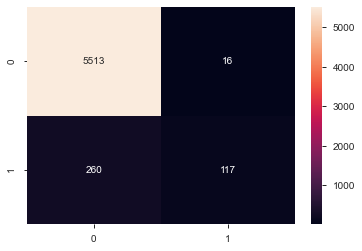

In [145]:
import seaborn as sns
sns.heatmap(cmLRr, annot=True, fmt='2g')

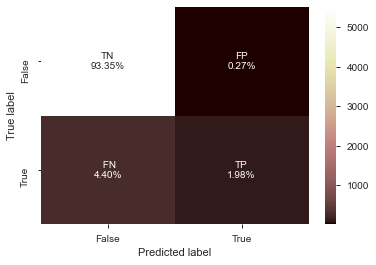

In [146]:
names = ['TN','FP',' FN','TP']

percent = ["{0:.2%}".format(value) for value in
                     cmLRr.flatten()/np.sum(cmLRr)]

labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(names,percent)]

labels = np.asarray(labels).reshape(2,2)

ax = sns.heatmap(cmLRr, annot=labels, fmt='', cmap='pink')

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [148]:
 print(classification_report(Yy_test, yyypred))

              precision    recall  f1-score   support

           0       0.95      1.00      0.98      5529
           1       0.88      0.31      0.46       377

    accuracy                           0.95      5906
   macro avg       0.92      0.65      0.72      5906
weighted avg       0.95      0.95      0.94      5906



In [170]:
from sklearn import svm

from sklearn.svm import SVC

SVM2 = SVC(kernel='rbf')
SVM2.fit(Xx_train, Yy_train)

SVC()

In [171]:
svpred = SVM2.predict(Xx_test)

In [172]:
f1_score(Yy_test,svpred)

0.5522388059701493

In [173]:
accuracy_score(Yy_test,svpred)

0.9593633592956315

In [174]:
precision_score(Yy_test,svpred)

0.9308176100628931

In [175]:
recall_score(Yy_test,svpred)

0.3925729442970822

In [176]:
cmSVM2=confusion_matrix(Yy_test,svpred)

<AxesSubplot:>

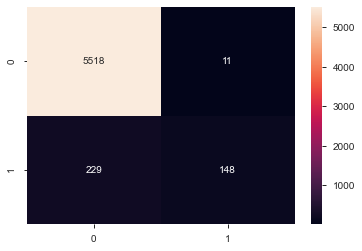

In [156]:
import seaborn as sns
sns.heatmap(cmSVM2, annot=True, fmt='2g')

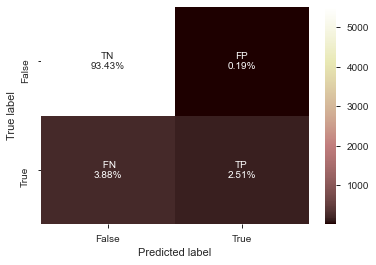

In [157]:
names = ['TN','FP',' FN','TP']

percent = ["{0:.2%}".format(value) for value in
                     cmSVM2.flatten()/np.sum(cmSVM2)]

labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(names,percent)]

labels = np.asarray(labels).reshape(2,2)

ax = sns.heatmap(cmSVM2, annot=labels, fmt='', cmap='pink')

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [158]:
#multinomial naive bayes LDA

from sklearn.naive_bayes import MultinomialNB
mnb1 = MultinomialNB(alpha=1.0, fit_prior=True, class_prior=None)
%time mnb1.fit(Xx_train, Yy_train)

Wall time: 13 ms


MultinomialNB()

In [159]:
mnb1_pred=mnb1.predict(Xx_test)
f1_score(Yy_test, mnb1_pred)

0.39430894308943093

In [160]:
accuracy_score(Yy_test,mnb1_pred)

0.9495428377920758

In [161]:
precision_score(Yy_test,mnb1_pred)

0.8434782608695652

In [162]:
recall_score(Yy_test,mnb1_pred)

0.2572944297082228

In [163]:
cmmnb1=confusion_matrix(Yy_test,mnb1_pred)

<AxesSubplot:>

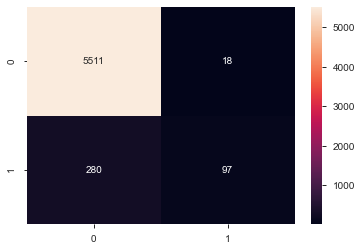

In [164]:
import seaborn as sns
sns.heatmap(cmmnb1, annot=True, fmt='2g',cbar_ax=None, square=False,mask=None)

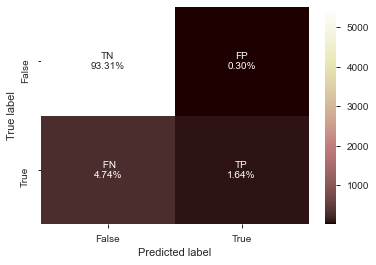

In [165]:
names = ['TN','FP',' FN','TP']

percent = ["{0:.2%}".format(value) for value in
                     cmmnb1.flatten()/np.sum(cmmnb1)]

labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(names,percent)]

labels = np.asarray(labels).reshape(2,2)
ax = sns.heatmap(cmmnb1, annot=labels, fmt='', cmap='pink')

ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

#visualization of the Confusion Matrix.
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [166]:
from sklearn.ensemble import RandomForestClassifier
rfc2 = RandomForestClassifier(n_estimators=250, criterion = "entropy", max_depth = None)
rfc2.fit(Xx_train, Yy_train)


RandomForestClassifier(criterion='entropy', n_estimators=250)

In [167]:
rfc2pred = rfc2.predict(Xx_test)

In [168]:
f1_score(Yy_test,rfc2pred)

0.6043405676126877

In [163]:
accuracy_score(Yy_test,rfc2pred)

0.9603792753132407

In [164]:
precision_score(Yy_test,rfc2pred)

0.8235294117647058

In [135]:
cmrfc2= confusion_matrix(Yy_test,rfc2pred)
recall_score(Yy_test,rfc2pred)

0.48010610079575594

<AxesSubplot:>

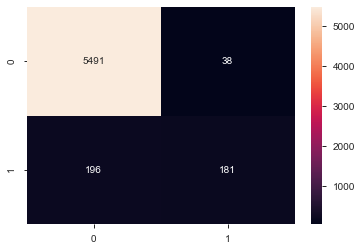

In [136]:
import seaborn as sns
sns.heatmap(cmrfc2, annot=True, fmt='2g',cbar_ax=None, square=False,mask=None)

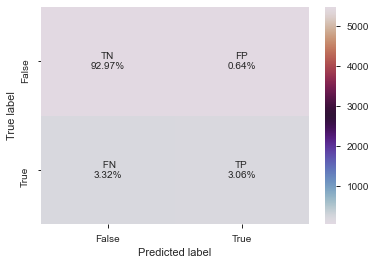

In [140]:
names = ['TN','FP',' FN','TP']

percent = ["{0:.2%}".format(value) for value in
                     cmrfc2.flatten()/np.sum(cmrfc2)]

labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(names,percent)]

labels = np.asarray(labels).reshape(2,2)
ax = sns.heatmap(cmrfc2, annot=labels, fmt='', cmap='twilight')

ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

# visualization of the Confusion Matrix.
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [124]:
from sklearn.tree import DecisionTreeClassifier
dtc1 = DecisionTreeClassifier(criterion='entropy', random_state=1)
dtc1.fit(Xx_train, Yy_train)


DecisionTreeClassifier(criterion='entropy', random_state=1)

In [125]:
dtc1_pred = dtc1.predict(Xx_test)
accuracy_score(Yy_test, dtc1_pred)*100

93.93836776159837

In [126]:
f1_score(Yy_test,dtc1_pred)

0.5095890410958904

In [127]:
accuracy_score(Yy_test,dtc1_pred)

0.9393836776159837

In [128]:
precision_score(Yy_test,dtc1_pred)

0.5269121813031161

In [129]:
cmdtc1= confusion_matrix(Yy_test, dtc1_pred)
recall_score(Yy_test,dtc1_pred)

0.493368700265252

<AxesSubplot:>

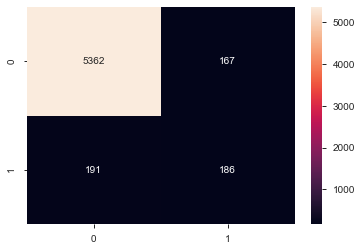

In [130]:
import seaborn as sns
sns.heatmap(cmdtc1, annot=True, fmt='2g',cbar_ax=None, square=False,mask=None)

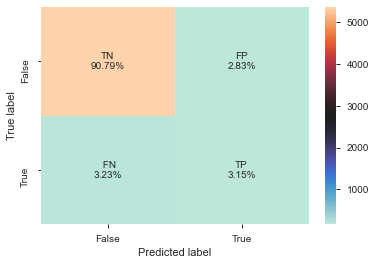

In [131]:
names = ['TN','FP',' FN','TP']

percent = ["{0:.2%}".format(value) for value in
                     cmdtc1.flatten()/np.sum(cmdtc1)]

labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(names,percent)]

labels = np.asarray(labels).reshape(2,2)
ax = sns.heatmap(cmdtc1, annot=labels, fmt='', cmap='icefire')

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [177]:
from sklearn.ensemble import GradientBoostingClassifier
gbc1 = GradientBoostingClassifier(n_estimators=25, learning_rate=0.5, max_features=2, max_depth=2, random_state=10)
gbc1.fit(Xx_train, Yy_train)

GradientBoostingClassifier(learning_rate=0.5, max_depth=2, max_features=2,
                           n_estimators=25, random_state=10)

In [178]:
gbc1_pred=gbc1.predict(Xx_test)

In [179]:
f1_score(Yy_test, gbc1_pred)*100

12.5

In [180]:
accuracy_score(Yy_test, gbc1_pred)*100

93.83677615983746

In [181]:
precision_score(Yy_test,gbc1_pred)*100

66.66666666666666

In [182]:
cmgbc1=confusion_matrix(Yy_test,gbc1_pred)
recall_score(Yy_test, gbc1_pred)*100

6.896551724137931

<AxesSubplot:>

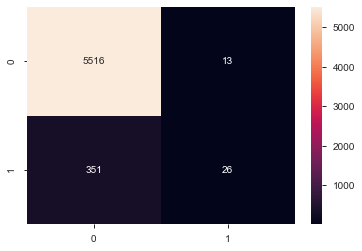

In [184]:
import seaborn as sns
sns.heatmap(cmgbc1, annot=True, fmt='2g',cbar_ax=None, square=False,mask=None)

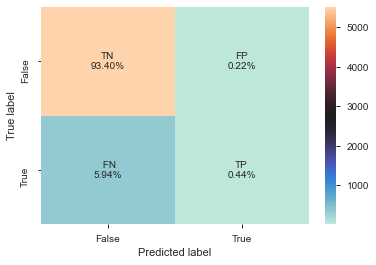

In [185]:
names = ['TN','FP',' FN','TP']

percent = ["{0:.2%}".format(value) for value in
                     cmgbc1.flatten()/np.sum(cmgbc1)]

labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(names,percent)]

labels = np.asarray(labels).reshape(2,2)
ax = sns.heatmap(cmgbc1, annot=labels, fmt='', cmap='icefire')

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [186]:
lda_model.print_topics(num_topics=100)

[(0,
  '0.203*"wait" + 0.152*"girl" + 0.074*"stop" + 0.054*"talk" + 0.044*"gun" + 0.032*"le" + 0.032*"buy" + 0.031*"wrong" + 0.030*"h" + 0.025*"sister"'),
 (1,
  '0.135*"#" + 0.089*"e" + 0.069*"order" + 0.050*"memori" + 0.033*"mine" + 0.026*"hungri" + 0.026*"paint" + 0.021*"email" + 0.020*"tattoo" + 0.014*"site"'),
 (2,
  '0.051*"self" + 0.047*"cant" + 0.041*"mr" + 0.037*"aist" + 0.034*"pizza" + 0.034*"respons" + 0.033*"due" + 0.032*"weather" + 0.027*"goodnight" + 0.027*"tho"'),
 (3,
  '0.184*"live" + 0.089*"place" + 0.071*"race" + 0.062*"could" + 0.061*"bear" + 0.055*"angri" + 0.047*"polar" + 0.044*"nation" + 0.037*"#" + 0.035*"climb"'),
 (4,
  '0.118*"monday" + 0.076*"#" + 0.075*"laugh" + 0.065*"daddi" + 0.025*"deep" + 0.022*"love" + 0.020*"bff" + 0.018*"often" + 0.018*"purpos" + 0.017*"lake"'),
 (5,
  '0.246*"#" + 0.081*"peac" + 0.062*"may" + 0.050*"stori" + 0.042*"rememb" + 0.040*"rest" + 0.031*"ladi" + 0.031*"love" + 0.030*"amp" + 0.026*"tv"'),
 (6,
  '0.308*"#" + 0.082*"home" + 0

In [128]:
for index, score in sorted(lda_model_tf[bow_corpus[2953]], key=lambda tup: -1*tup[1]):
    print("\nScore: {}\t \nTopic: {}".format(score, lda_model_tf.print_topic(index, 10)))


Score: 0.774931788444519	 
Topic: 0.013*"#" + 0.004*"love" + 0.004*"smile" + 0.003*"happi" + 0.003*"make" + 0.003*"weekend" + 0.003*"day" + 0.003*"peopl" + 0.003*"morn" + 0.003*"amp"

Score: 0.025011109188199043	 
Topic: 0.013*"#" + 0.012*"thank" + 0.007*"posit" + 0.004*"day" + 0.003*"good" + 0.003*"love" + 0.003*"today" + 0.003*"amp" + 0.003*"year" + 0.003*"happi"

Score: 0.02500913292169571	 
Topic: 0.013*"#" + 0.006*"love" + 0.005*"day" + 0.004*"cute" + 0.004*"life" + 0.004*"get" + 0.004*"feel" + 0.003*"time" + 0.003*"beauti" + 0.003*"new"

Score: 0.025008948519825935	 
Topic: 0.012*"father" + 0.011*"day" + 0.011*"#" + 0.005*"love" + 0.004*"dad" + 0.004*"u" + 0.004*"happi" + 0.003*"amp" + 0.003*"new" + 0.003*"life"

Score: 0.02500724606215954	 
Topic: 0.010*"#" + 0.005*"bull" + 0.003*"amp" + 0.003*"love" + 0.003*"get" + 0.003*"day" + 0.003*"happi" + 0.003*"whatev" + 0.003*"thank" + 0.003*"want"

Score: 0.025007128715515137	 
Topic: 0.011*"#" + 0.004*"day" + 0.003*"love" + 0.003*"ha

In [189]:
from gensim.models import CoherenceModel
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=new)
coherence_model_lda.get_coherence()


0.4894287217637813

In [190]:
pip install pyLDAvis

Note: you may need to restart the kernel to use updated packages.


In [192]:
import pyLDAvis.gensim


In [195]:
# Visualizing the topics
pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(lda_model, bow_corpus, dictionary)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
14     0.250960 -0.017989       1        1  3.818158
8      0.270926 -0.007233       2        1  3.746224
43     0.263913  0.002789       3        1  3.092118
61     0.163181  0.032267       4        1  2.555480
54     0.211552  0.028094       5        1  2.255581
...         ...       ...     ...      ...       ...
10    -0.074670 -0.090208      96        1  0.458124
45    -0.212008 -0.087530      97        1  0.448400
2     -0.177800 -0.044843      98        1  0.443108
15    -0.202835 -0.091110      99        1  0.382330
90    -0.212717 -0.083393     100        1  0.355124

[100 rows x 5 columns], topic_info=       Term          Freq         Total  Category  logprob  loglift
0         #  68329.000000  68329.000000   Default  30.0000  30.0000
81      day   2672.000000   2672.000000   Default  29.0000  29.0000
147   happi   1934.000000   1934.000000   Default  28.0000  28.0000
14    thank   1074.000000   1074.000000   Default  27.0000  27.0000
24        u   1005.000000   1005.000000   Default  26.0000  26.0000
...     ...           ...           ...       ...      ...      ...
424    seek     18.740972     22.231231  Topic100  -4.0479   5.4697
7724  panda      6.914681      8.743989  Topic100  -5.0449   5.4057
145     amp     19.396256   1610.901009  Topic100  -4.0135   1.2210
83      see     10.722125    815.575407  Topic100  -4.6063   1.3089
398     new     10.290750    991.399792  Topic100  -4.6473   1.0726

[3867 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
0         1  0.089683        #
0         2  0.092010        #
0         3  0.073731        #
0         4  0.029489        #
0         5  0.037129        #
...     ...       ...      ...
5866    100  0.930487  zealand
4841     15  0.916829    zelda
4733     37  0.937784      zen
3409     80  0.790429  zionazi
1653     92  0.865413      zoo

[4647 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[15, 9, 44, 62, 55, 98, 19, 68, 84, 57, 61, 81, 54, 64, 34, 7, 22, 45, 35, 17, 42, 18, 85, 63, 89, 48, 43, 88, 80, 56, 1, 31, 95, 59, 14, 10, 87, 39, 21, 86, 67, 74, 52, 78, 6, 20, 28, 97, 96, 41, 23, 72, 4, 36, 77, 49, 58, 38, 37, 50, 33, 8, 83, 13, 12, 92, 66, 93, 71, 73, 24, 60, 65, 26, 51, 90, 32, 30, 69, 47, 94, 99, 70, 100, 79, 40, 2, 27, 53, 25, 75, 76, 5, 82, 29, 11, 46, 3, 16, 91])

In [196]:
len(bow_corpus)

29530

In [102]:
pip install --upgrade pip

  Attempting uninstall: pip
    Found existing installation: pip 21.2.2
    Uninstalling pip-21.2.2:
      Successfully uninstalled pip-21.2.2
Note: you may need to restart the kernel to use updated packages.


In [197]:
# Importing required libraries
import nltk
import pandas as pd
from nltk.corpus import stopwords

from sklearn.preprocessing import LabelEncoder
from collections import Counter
import wordcloud
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score




In [207]:
import tensorflow 

In [208]:
import keras

In [213]:
from tensorflow import keras

In [221]:
from sklearn.feature_extraction.text import CountVectorizer

from tensorflow.python.keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical
import re

ModuleNotFoundError: No module named 'tensorflow.python.keras.preprocessing'

In [137]:

tweet = data_frame.clean_tweet.values
tokenizer = Tokenizer(num_words=5000, split=' ')
tokenizer.fit_on_texts(data_frame['clean_tweet'].values)
X = tokenizer.texts_to_sequences(tweet)

In [138]:

X = pad_sequences(X, maxlen=100)

In [139]:
X.shape

(29530, 100)

In [140]:
print(tweet[7])
print(X[7])

next school year year exam think #school #exam #hate #imagin #actorslif #revolutionschool #girl
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0   79  139   38   38 1006   46  139 1006   99  949
 3202   28]


In [141]:
print(tokenizer.word_index)

{'day': 1, 'love': 2, 'happi': 3, 'amp': 4, 'go': 5, 'life': 6, 'get': 7, 'thank': 8, 'today': 9, 'like': 10, 'u': 11, 'new': 12, 'make': 13, 'father': 14, 'time': 15, 'smile': 16, 'bihday': 17, 'peopl': 18, 'see': 19, 'one': 20, 'good': 21, 'feel': 22, 'friend': 23, 'look': 24, 'work': 25, 'want': 26, 'wait': 27, 'girl': 28, 'weekend': 29, 'come': 30, 'fun': 31, 'week': 32, 'beauti': 33, 'posit': 34, 'famili': 35, 'need': 36, 'summer': 37, 'year': 38, 'friday': 39, 'got': 40, 'great': 41, 'know': 42, 'first': 43, 'morn': 44, 'back': 45, 'think': 46, 'world': 47, 'live': 48, 'tomorrow': 49, 'best': 50, 'thing': 51, 'follow': 52, 'way': 53, 'watch': 54, 'dad': 55, 'realli': 56, 'say': 57, 'sta': 58, 'even': 59, 'sad': 60, 'orlando': 61, 'home': 62, 'music': 63, 'never': 64, 'night': 65, 'blog': 66, 'fathersday': 67, 'cute': 68, 'sunday': 69, 'trump': 70, 'take': 71, 'much': 72, 'right': 73, 'play': 74, 'bless': 75, 'final': 76, 'alway': 77, 'last': 78, 'next': 79, 'show': 80, 'let': 81,

In [113]:
embed_dim = 128
lstm_out = 196
max_features=5000

model1 = Sequential()
model1.add(Embedding(embed_dim , input_length = 100, output_dim=800))
model1.add(SpatialDropout1D(0.4))
model1.add(LSTM(lstm_out, dropout=0.2, recurrent_dropout=0.2))
model1.add(Dense(2,activation='softmax'))
model1.compile(loss = 'categorical_crossentropy', optimizer='adam',metrics = ['accuracy'])
print(model1.summary())

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 100, 800)          102400    
_________________________________________________________________
spatial_dropout1d_1 (Spatial (None, 100, 800)          0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 196)               781648    
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 394       
Total params: 884,442
Trainable params: 884,442
Non-trainable params: 0
_________________________________________________________________
None


In [289]:
Y = pd.get_dummies(data_frame['label'])
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.20, random_state = 42)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)

(23624, 100) (23624, 2)
(5906, 100) (5906, 2)


In [293]:

model3.fit(X_train, Y_train, epochs = 7, batch_size=32, verbose = 2)

Epoch 1/7


InvalidArgumentError:  indices[15,93] = 541 is not in [0, 500)
	 [[node sequential_37/embedding_2/embedding_lookup
 (defined at C:\Users\HP\anaconda3\lib\site-packages\keras\layers\embeddings.py:191)
]] [Op:__inference_train_function_13333]

Errors may have originated from an input operation.
Input Source operations connected to node sequential_37/embedding_2/embedding_lookup:
In[0] sequential_37/embedding_2/embedding_lookup/11596:	
In[1] sequential_37/embedding_2/Cast (defined at C:\Users\HP\anaconda3\lib\site-packages\keras\layers\embeddings.py:190)

Operation defined at: (most recent call last)
>>>   File "C:\Users\HP\anaconda3\lib\runpy.py", line 194, in _run_module_as_main
>>>     return _run_code(code, main_globals, None,
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\runpy.py", line 87, in _run_code
>>>     exec(code, run_globals)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
>>>     app.launch_new_instance()
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\traitlets\config\application.py", line 846, in launch_instance
>>>     app.start()
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel\kernelapp.py", line 677, in start
>>>     self.io_loop.start()
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\tornado\platform\asyncio.py", line 199, in start
>>>     self.asyncio_loop.run_forever()
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\asyncio\base_events.py", line 570, in run_forever
>>>     self._run_once()
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\asyncio\base_events.py", line 1859, in _run_once
>>>     handle._run()
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\asyncio\events.py", line 81, in _run
>>>     self._context.run(self._callback, *self._args)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 457, in dispatch_queue
>>>     await self.process_one()
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 446, in process_one
>>>     await dispatch(*args)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 353, in dispatch_shell
>>>     await result
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 648, in execute_request
>>>     reply_content = await reply_content
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel\ipkernel.py", line 353, in do_execute
>>>     res = shell.run_cell(code, store_history=store_history, silent=silent)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel\zmqshell.py", line 533, in run_cell
>>>     return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2901, in run_cell
>>>     result = self._run_cell(
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2947, in _run_cell
>>>     return runner(coro)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\IPython\core\async_helpers.py", line 68, in _pseudo_sync_runner
>>>     coro.send(None)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3172, in run_cell_async
>>>     has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3364, in run_ast_nodes
>>>     if (await self.run_code(code, result,  async_=asy)):
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3444, in run_code
>>>     exec(code_obj, self.user_global_ns, self.user_ns)
>>> 
>>>   File "C:\Users\HP\AppData\Local\Temp/ipykernel_4152/2917374864.py", line 1, in <module>
>>>     model3.fit(X_train, Y_train, epochs = 7, batch_size=32, verbose = 'auto')
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 64, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\training.py", line 1216, in fit
>>>     tmp_logs = self.train_function(iterator)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\training.py", line 878, in train_function
>>>     return step_function(self, iterator)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\training.py", line 867, in step_function
>>>     outputs = model.distribute_strategy.run(run_step, args=(data,))
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\training.py", line 860, in run_step
>>>     outputs = model.train_step(data)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\training.py", line 808, in train_step
>>>     y_pred = self(x, training=True)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 64, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\base_layer.py", line 1083, in __call__
>>>     outputs = call_fn(inputs, *args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 92, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\sequential.py", line 373, in call
>>>     return super(Sequential, self).call(inputs, training=training, mask=mask)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\functional.py", line 451, in call
>>>     return self._run_internal_graph(
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\functional.py", line 589, in _run_internal_graph
>>>     outputs = node.layer(*args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 64, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\base_layer.py", line 1083, in __call__
>>>     outputs = call_fn(inputs, *args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 92, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\layers\embeddings.py", line 191, in call
>>>     out = tf.nn.embedding_lookup(self.embeddings, inputs)
>>> 

In [281]:

score = model1.evaluate(X_test, Y_test)



InvalidArgumentError:  indices[21,94] = 3717 is not in [0, 500)
	 [[node sequential_34/embedding/embedding_lookup
 (defined at C:\Users\HP\anaconda3\lib\site-packages\keras\layers\embeddings.py:191)
]] [Op:__inference_test_function_1426]

Errors may have originated from an input operation.
Input Source operations connected to node sequential_34/embedding/embedding_lookup:
In[0] sequential_34/embedding/embedding_lookup/1084:	
In[1] sequential_34/embedding/Cast (defined at C:\Users\HP\anaconda3\lib\site-packages\keras\layers\embeddings.py:190)

Operation defined at: (most recent call last)
>>>   File "C:\Users\HP\anaconda3\lib\runpy.py", line 194, in _run_module_as_main
>>>     return _run_code(code, main_globals, None,
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\runpy.py", line 87, in _run_code
>>>     exec(code, run_globals)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
>>>     app.launch_new_instance()
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\traitlets\config\application.py", line 846, in launch_instance
>>>     app.start()
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel\kernelapp.py", line 677, in start
>>>     self.io_loop.start()
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\tornado\platform\asyncio.py", line 199, in start
>>>     self.asyncio_loop.run_forever()
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\asyncio\base_events.py", line 570, in run_forever
>>>     self._run_once()
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\asyncio\base_events.py", line 1859, in _run_once
>>>     handle._run()
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\asyncio\events.py", line 81, in _run
>>>     self._context.run(self._callback, *self._args)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 457, in dispatch_queue
>>>     await self.process_one()
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 446, in process_one
>>>     await dispatch(*args)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 353, in dispatch_shell
>>>     await result
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 648, in execute_request
>>>     reply_content = await reply_content
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel\ipkernel.py", line 353, in do_execute
>>>     res = shell.run_cell(code, store_history=store_history, silent=silent)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\ipykernel\zmqshell.py", line 533, in run_cell
>>>     return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2901, in run_cell
>>>     result = self._run_cell(
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2947, in _run_cell
>>>     return runner(coro)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\IPython\core\async_helpers.py", line 68, in _pseudo_sync_runner
>>>     coro.send(None)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3172, in run_cell_async
>>>     has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3364, in run_ast_nodes
>>>     if (await self.run_code(code, result,  async_=asy)):
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3444, in run_code
>>>     exec(code_obj, self.user_global_ns, self.user_ns)
>>> 
>>>   File "C:\Users\HP\AppData\Local\Temp/ipykernel_4152/1469600762.py", line 1, in <module>
>>>     score = model1.evaluate(X_test, Y_test)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 64, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\training.py", line 1537, in evaluate
>>>     tmp_logs = self.test_function(iterator)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\training.py", line 1366, in test_function
>>>     return step_function(self, iterator)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\training.py", line 1356, in step_function
>>>     outputs = model.distribute_strategy.run(run_step, args=(data,))
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\training.py", line 1349, in run_step
>>>     outputs = model.test_step(data)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\training.py", line 1303, in test_step
>>>     y_pred = self(x, training=False)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 64, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\base_layer.py", line 1083, in __call__
>>>     outputs = call_fn(inputs, *args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 92, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\sequential.py", line 373, in call
>>>     return super(Sequential, self).call(inputs, training=training, mask=mask)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\functional.py", line 451, in call
>>>     return self._run_internal_graph(
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\functional.py", line 589, in _run_internal_graph
>>>     outputs = node.layer(*args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 64, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\engine\base_layer.py", line 1083, in __call__
>>>     outputs = call_fn(inputs, *args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 92, in error_handler
>>>     return fn(*args, **kwargs)
>>> 
>>>   File "C:\Users\HP\anaconda3\lib\site-packages\keras\layers\embeddings.py", line 191, in call
>>>     out = tf.nn.embedding_lookup(self.embeddings, inputs)
>>> 

In [285]:
#splitting for testing

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(TTF, data_frame['label'], random_state=0,shuffle=True, test_size=0.2, stratify=df['label'])

In [163]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(23624, 2500)
(23624,)
(5906, 2500)
(5906,)


In [164]:
# TFIDF LOGISTIC REGRESSION

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, accuracy_score

In [165]:
# training
LR = LogisticRegression(random_state=0, penalty='l2', solver='liblinear')


In [166]:
%time LR.fit(x_train, y_train)

Wall time: 77.5 ms


LogisticRegression(random_state=0, solver='liblinear')

In [167]:
# testing
ypred = LR.predict(x_test)
f1_score(y_test, ypred)

0.4351005484460695

In [156]:

from sklearn.metrics import confusion_matrix, accuracy_score
cfLR=confusion_matrix(y_test, ypred)
accuracy_score(y_test,ypred)*100

94.76803250931256

In [216]:
cfLR

array([[5478,   25],
       [ 284,  119]], dtype=int64)

<AxesSubplot:>

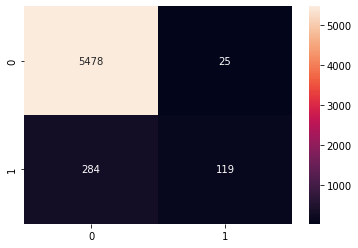

In [220]:
import seaborn as sns
sns.heatmap(cfLR, annot=True,fmt='2g')

<AxesSubplot:>

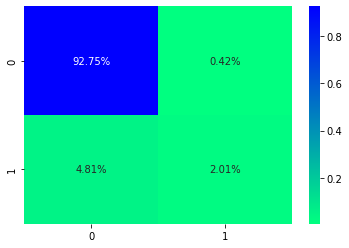

In [228]:
sns.heatmap(cfLR/np.sum(cfLR), annot=True, 
            fmt='.2%', cmap='winter_r')

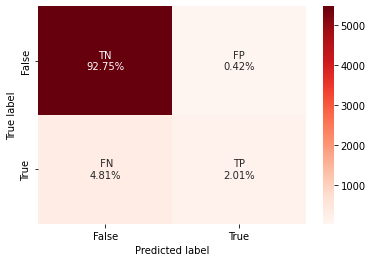

In [214]:
names = ['TN','FP',' FN','TP']

percent = ["{0:.2%}".format(value) for value in
                     cfLR.flatten()/np.sum(cfLR)]

labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(names,percent)]

labels = np.asarray(labels).reshape(2,2)

ax = sns.heatmap(cfLR, annot=labels, fmt='', cmap='Reds')

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [168]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [172]:
lida = LinearDiscriminantAnalysis()

lida_t = lida.fit(x_train,y_train)

In [174]:
pred_lid = lida_t.predict(x_test)

In [175]:
accuracy_score( y_test, pred_lid)*100

95.2251947172367

In [173]:
#SUPPORT VECTOR MACHINE

from sklearn.metrics import accuracy_score, f1_score

from sklearn import svm

from sklearn.svm import SVC

SVM1 = SVC(kernel='linear')

In [160]:
%time SVM1.fit(x_train, y_train)

Wall time: 5.69 s


SVC(kernel='linear')

In [161]:

from sklearn.metrics import confusion_matrix, accuracy_score

pred_SVM1 = SVM1.predict(x_test)
cfSVM1=confusion_matrix(y_test, pred_SVM1)
accuracy_score( y_test, pred_SVM1)*100

95.27599051811717

In [82]:
f1_score(y_test, pred_SVM1)

0.5319148936170214

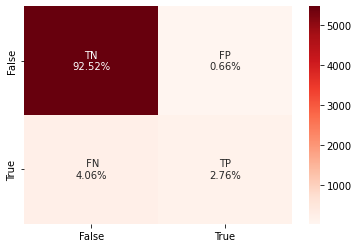

In [176]:
names = ['TN','FP',' FN','TP']

percent = ["{0:.2%}".format(value) for value in
                     cfSVM1.flatten()/np.sum(cfSVM1)]

labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(names,percent)]

labels = np.asarray(labels).reshape(2,2)

ax = sns.heatmap(cfSVM1, annot=labels, fmt='', cmap='Reds')

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

In [83]:
#Bernoullinb naive bayes
from sklearn.naive_bayes import *
from sklearn import metrics

clf=BernoulliNB()
clf.fit(x_train,y_train)
predN=clf.predict(x_test)
metrics.accuracy_score(y_test, predN)*100

93.94555058919138

In [86]:
#multinomial naive bayes

from sklearn.naive_bayes import MultinomialNB
mnb = MultinomialNB(alpha=1.0, fit_prior=True, class_prior=None)
%time mnb.fit(x_train, y_train)


NameError: name 'x_test' is not defined

Wall time: 8.01 ms


MultinomialNB()

In [165]:
 accuracy_score(y_test,predM)*100

94.73416864205892

In [166]:
f1_score(y_test, predM)

0.4251386321626617

In [170]:
# Making the Confusion Matrix of MNB
# Compute and plot the Confusion matrix

from sklearn.metrics import confusion_matrix, accuracy_score
cf=confusion_matrix(y_test, predM)

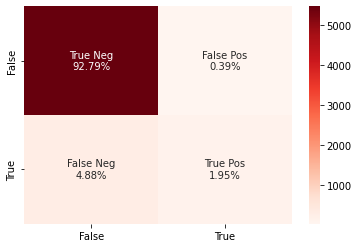

In [177]:
names = ['True Neg','False Pos','False Neg','True Pos']

percent = ["{0:.2%}".format(value) for value in
                     cf.flatten()/np.sum(cf)]

labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(names,percent)]

labels = np.asarray(labels).reshape(2,2)
ax = sns.heatmap(cf, annot=labels, fmt='', cmap='Reds')

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

In [179]:
f1_score(y_test, predM)

0.4251386321626617

In [ ]:
#random forest
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=250, criterion = "entropy", max_depth = None, bootstrap=True)
rfc.fit(x_train, y_train)


In [ ]:
pred_rfc = rfc.predict(x_test)

In [ ]:
#f1-score
f1_score(y_test,pred_rfc)


In [183]:
#Accuracy_score
from sklearn.metrics import accuracy_score
accuracy_score(y_test,pred_rfc)*100


95.52996952251948

In [186]:
#Creating the Confusion matrix for RFC
from sklearn.metrics import confusion_matrix  
cfr=confusion_matrix(y_test, pred_rfc)  

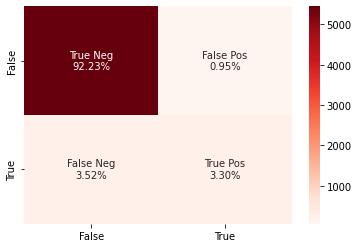

In [187]:
names = ['True Neg','False Pos','False Neg','True Pos']
percent = ["{0:.2%}".format(value) for value in
                     cfr.flatten()/np.sum(cfr)]

labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(names,percent)]

labels = np.asarray(labels).reshape(2,2)

ax = sns.heatmap(cfr, annot=labels, fmt='', cmap='Reds')

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

In [188]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier(criterion='entropy', random_state=1)
dtc.fit(x_train, y_train)
dtc_pred = dtc.predict(x_test)
accuracy_score(y_test, dtc_pred)*100

93.83677615983746

In [189]:
f1_score(y_test, dtc_pred)

0.5210526315789473

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
   gbc = GradientBoostingClassifier(n_estimators=30, learning_rate=learning_rate, max_features=5, max_depth=2, random_state=20)
    gbc.fit(x_train, y_train)

In [190]:
# Load libraries
from sklearn.ensemble import AdaBoostClassifier
from sklearn import datasets

#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics

In [191]:
# Create adaboost classifer object
abc = AdaBoostClassifier(base_estimator= dtc, n_estimators=100,
                         learning_rate=1, random_state=0)
# Train Adaboost Classifer
abc.fit(x_train, y_train)


AdaBoostClassifier(base_estimator=DecisionTreeClassifier(criterion='entropy',
                                                         random_state=1),
                   learning_rate=1, n_estimators=100, random_state=0)

In [192]:
# Train Adaboost Classifer
abc.score(x_train, y_train)

0.998306806637318

In [194]:

abc_pred = abc.predict(x_test)
accuracy_score(y_test, abc_pred)*100

93.78598035895699

In [195]:
f1_score(y_test, abc_pred)

0.5227568270481145

In [205]:
# Create adaboost classifer object

abcLR = AdaBoostClassifier(base_estimator= LR, n_estimators=100,
                         learning_rate=1, random_state=0)
# Train Adaboost Classifer
abcLR.fit(x_train, y_train)

AdaBoostClassifier(base_estimator=LogisticRegression(random_state=0,
                                                     solver='liblinear'),
                   learning_rate=1, n_estimators=100, random_state=0)

In [206]:
abcLR_pred = abcLR.predict(x_test)
accuracy_score(y_test, abcLR_pred)*100

93.17643074839147

In [154]:
pip install xgboost

C:\Users\HP\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [208]:
from xgboost import XGBClassifier
model_xgb = XGBClassifier(random_state=22,learning_rate=0.9)
model_xgb.fit(x_train, y_train)

[18:28:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.9, max_delta_step=0,
              max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=22,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [ ]:
model_xgb

In [140]:
import gensim
import pprint
from gensim import corpora


In [141]:
dic = corpora.Dictionary(new)

In [143]:
print(dic.token2id)

{'#': 0, 'drags': 1, 'dysfunction': 2, 'dysfunctional': 3, 'father': 4, 'kids': 5, 'run': 6, 'selfish': 7, 'cause': 8, 'credit': 9, 'disapointed': 10, 'getthanked': 11, 'lyft': 12, 'offer': 13, 'pdx': 14, 'thanks': 15, 'use': 16, 'vans': 17, 'wheelchair': 18, 'bihday': 19, 'majesty': 20, 'love': 21, 'model': 22, 'take': 23, 'time': 24, 'u': 25, 'ur': 26, 'factsguide': 27, 'motivation': 28, 'society': 29, 'allshowandnogo': 30, 'big': 31, 'chaos': 32, 'disputes': 33, 'fan': 34, 'fare': 35, 'get': 36, 'huge': 37, 'leave': 38, 'pay': 39, 'talking': 40, 'camping': 41, 'danny': 42, 'tomorrow': 43, 'actorslife': 44, 'exams': 45, 'girl': 46, 'hate': 47, 'imagine': 48, 'next': 49, 'revolutionschool': 50, 'school': 51, 'think': 52, 'year': 53, 'allin': 54, 'cavs': 55, 'champions': 56, 'cleveland': 57, 'clevelandcavaliers': 58, 'land': 59, 'gr': 60, 'welcome': 61, 'blog': 62, 'climbed': 63, 'consumer': 64, 'forex': 65, 'gold': 66, 'index': 67, 'ireland': 68, 'may': 69, 'mom': 70, 'previous': 71, 

In [ ]:
pip install bar_chart_race